In [ ]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')

# Introdução

## Classificação das redes neurais

A grande **maioria das redes neurais** pode ser usadas para **propósitos gerais**:
 - Classificação de textos
 - Classificação de imagens
 - Previsão de séries temporais
    
Entretanto **algumas arquiteturas** têm **melhores resultados em tarefas específicas**:

https://towardsdatascience.com/the-mostly-complete-chart-of-neural-networks-explained-3fb6f2367464

- Multilayer Perceptron (MLP) ou Feed Forward (FF)
    - Baseada na Perceptron
    - Uso geral (Mais usada em regressão, criação de funções ou controladores)
    - Camadas densas
    
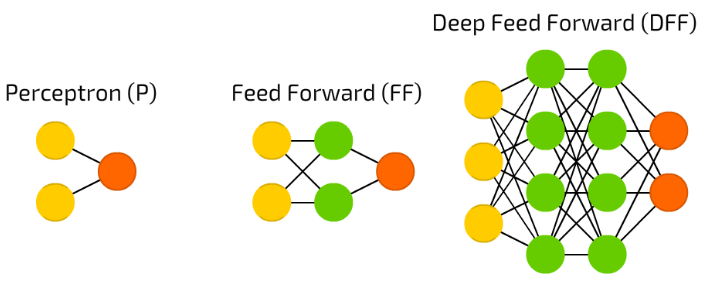

- Recurrent Neural Network (RNN) e suas variantes
    - Usada para dados que depende de sequência lógica (Textos, audio, séries temporais, etc)
    - Neurônios com realimentação e delay (Memória)
    - Nêurônios da mesma camada interconectados
    
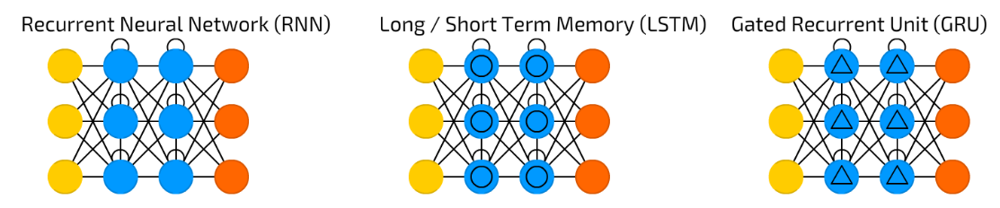

- Auto Enconder e suas variantes
    - Usada na generalização, encontrar padrões, classificação de imagens
    - Compacta uma imagem e reconstroi a mesma na saída
    - A camada de entrada tem a mesma quantidade de neurônios da camada de saída
    
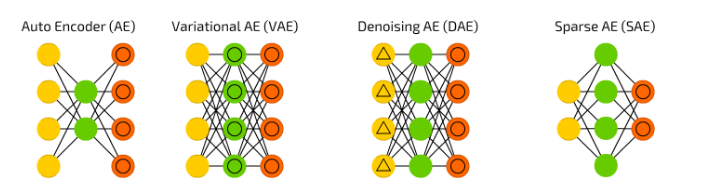

- **Convolutional Neural Network (CNN)**
    - **Classificação de imagens**
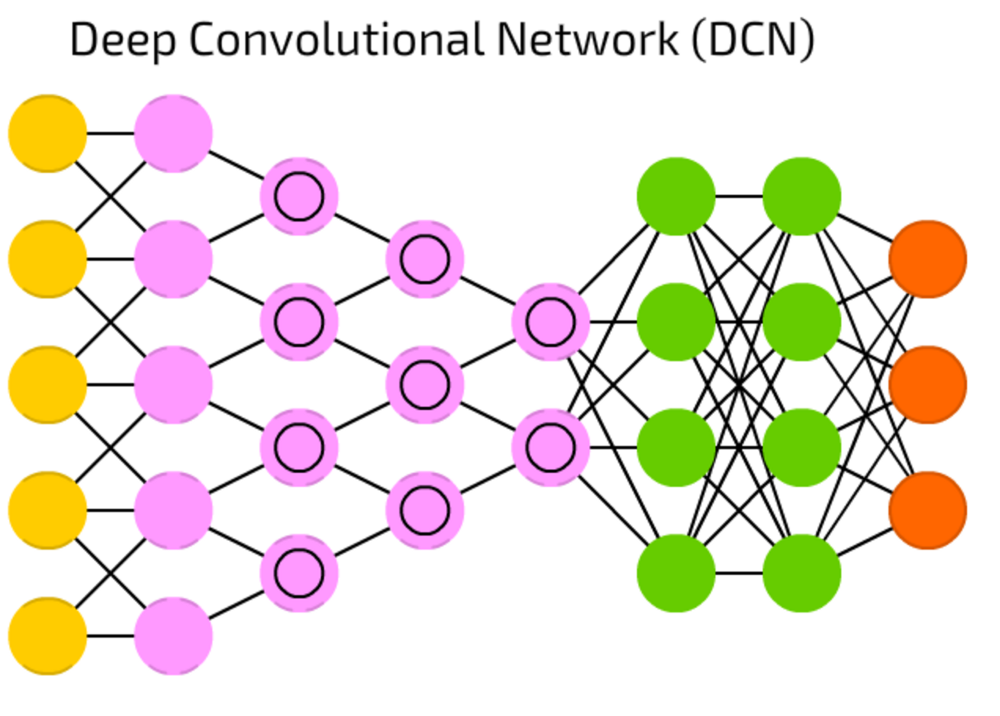

- Deconvolutional Neural Network (DNN)
    - É a CNN inversa
    - Dado um vetor com uma classificação a rede desenha uma imagem

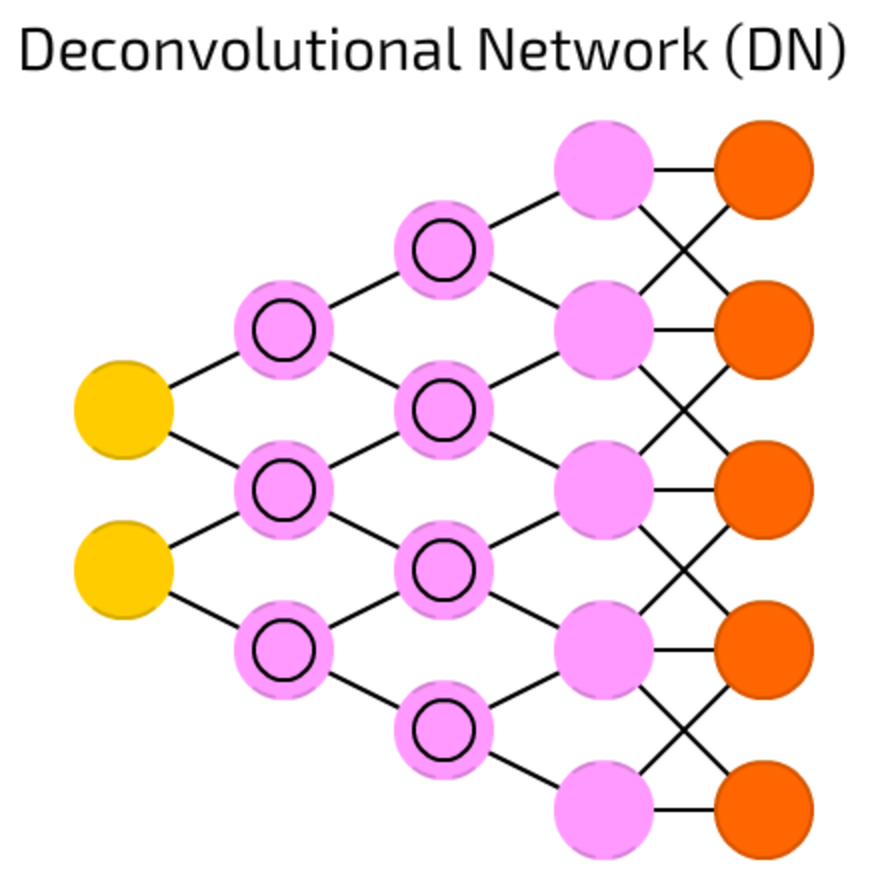

- Convolutinal Inverse Graphics Network

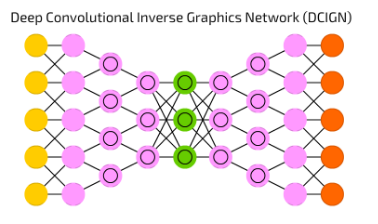

- Dentre outros

## Aplicação das CNNs

- Uma das principais arquiteturas na área de **visão computacional**

- Vem sendo usado em:
    - Classificação de imagens
    - Carros autônomos
    - Análise de exames médicos (Doenças de péles, câncer, exames de raio x, etc)
    - Reconhecimento de dígitos
    - Definição de Captions
    - Detecção de objetos
    - Etc

## Visão computacional

https://towardsdatascience.com/evolution-of-object-detection-and-localization-algorithms-e241021d8bad

Em visão computacional o problema pode está dividido em:

1. Classificação de imagens
2. Localização de objetos
3. Reconhecimento de objetos

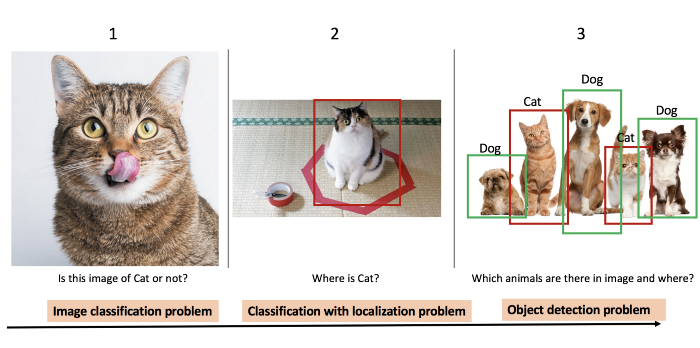

(Explica que vai usar a classificação de imagens por ser mais simples)

https://link.springer.com/article/10.1007/s11263-019-01247-4

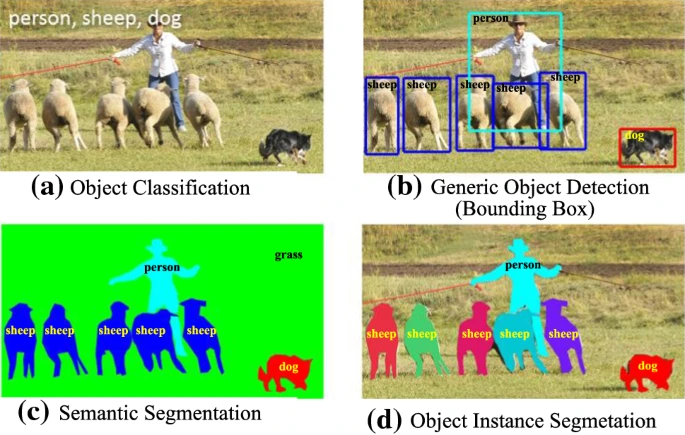

## Livros sobre Redes Neurais

http://neuralnetworksanddeeplearning.com/

https://www.deeplearningbook.org/

# Redes Neurais convolucionais

Uma CNN é composta por duas partes:

- Filtros de características (Feature learning) $\rightarrow$ Camada de filtros (Convolução e Pooling)
- Classificação $\rightarrow$ Rede neural densa FeedFoward
    - Composta por um Flatten na sua entrada (Transforma a matriz da imagem em um único vetor)

A arquitetura básica das redes neurais convolucionais (CNN) é apresentada abaixo:

https://towardsdatascience.com/convolutional-neural-network-a-step-by-step-guide-a8b4c88d6943

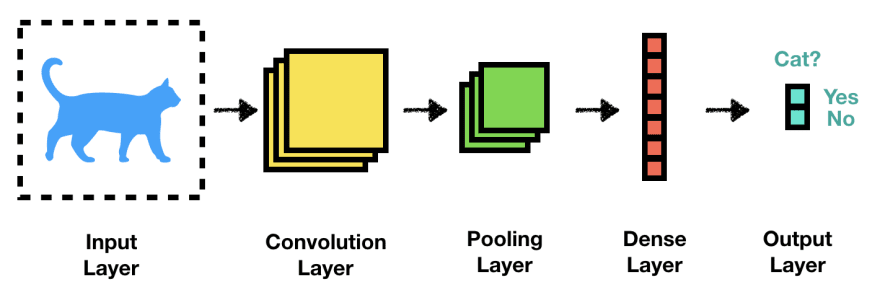

https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

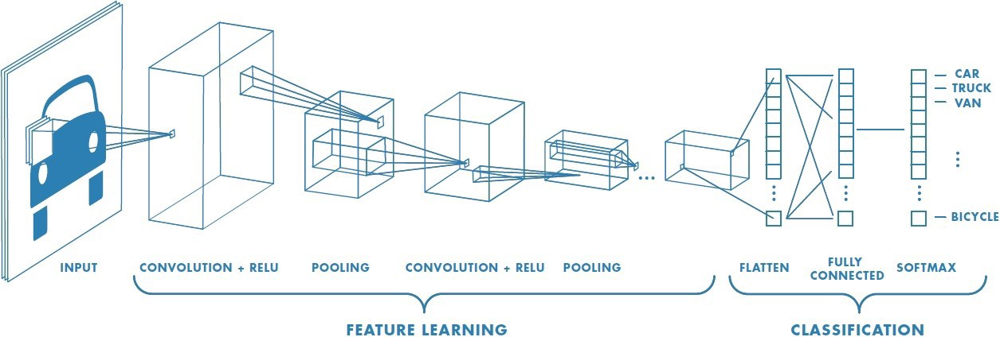

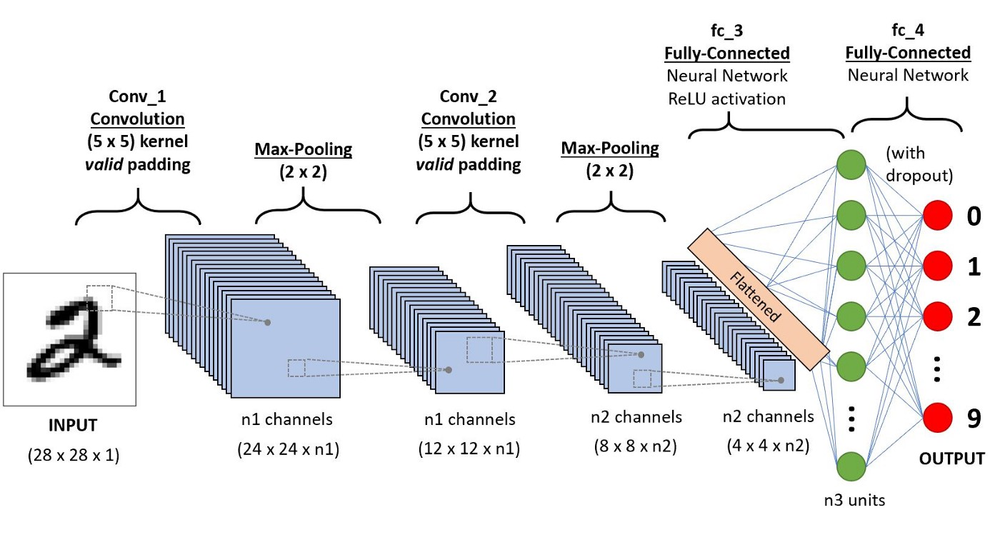

https://ysjournal.com/medical-image-translation-using-convolutional-neural-networks/

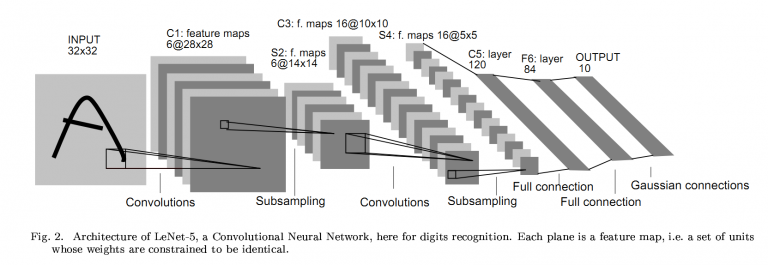

https://pythonmachinelearning.pro/introduction-to-convolutional-neural-networks-for-vision-tasks/

## Convolução

### Convolução no tempo

- A operação de convolução é bastante conhecida em engenharia elétrica
- A convolução entre um sinal e um filtro gera a resposta do sinal após o filtro

A definição matemática da convolução é apresentada abaixo:

$$
s(t)=(x*w)(t)=\int x(a)w(t-a)da
$$

onde:

- $s(t)$ $\rightarrow$ Sinal convoluído
- $(x*w)(t)$ $\rightarrow$ Operação de convolução entre o sinal $x(t)$ e $w(t)$
- $x(t)$ $\rightarrow$ Sinal de entrada
- $w(t)$ $\rightarrow$ Filtro (Pode ser uma função de transferência, equação da diferença, matriz, etc)

Em tempo discreto a convolução é definida como:

$$
s(k)=(x*w)(k)=\sum_{a=-\infty}^{\infty}x(a)w(k-a)
$$

O processo para o cálculo da soma de convolução é:

1. **Dobramento:** Inverte-se o filtro no tempo (Imagem espelhadado sinal) para obter $w(-a)$
2. **Deslocamento:** Desloca o filtro (ou atrasa) em $k$ para obter $w(k-a)$ 
3. **Multiplicação:** Multiplica-se $w(k-a)$ por $x(a)$
4. **Soma:** Para cada amostra $k$ soma-se o produto do passo 3

### Convolução em imagens

Imagens são sinais invariantes no tempo e matriciais.

Considerando uma imagem com duas dimensões, cada elemento do sinal convoluido é dado por:

$$
S(i,j)=(I*K)(i,j)=\sum_m\sum_nI(m,n)K(i-m,j-n)
$$

Onde:
- $I(i,j)$ $\rightarrow$ A imagem (Uma matriz bidimensional)
- $K(i,j)$ $\rightarrow$ O Kernel (Ou o filtro que tem a forma de uma matriz)
- $S(i,j)$ $\rightarrow$ Sinal convoluído (Ou saída do filtro)

Assim como nos sinais temporais, o processo de cálculo da soma de convolução tem 4 etapas:
1. **Dobramento:** Espelha o Kernel en função de $m$ e $n$ para obter $K(-m,-n)$
2. **Deslocamento:** Desloca o Kernel em $i$ e $j$ para obter $K(i-m,j-n)$ 
3. **Multiplicação:** Multiplica-se $K(i-m,j-n)$  por I(m,n)
4. **Soma:** Para píxel $(i,j)$ soma-se o produto do passo 3

**Propriedade comutativa** $\rightarrow$ A convolução é comutativa, ou seja:

$$
S(i,j)=(K*I)(i,j)=\sum_m\sum_nI(i-m,j-n)K(m,n)
$$

### Correlação cruzada (Cross-correlation) 

- É o mesmo que a convolução, mas sem inverter um dos sinais da operação
- É a operação utilizada nas CNNs
- Alguns autores chamam a **correlação cruzada** como convolução sem o espelhamento do Kernel, ou simplesmente, **convolução**.

$$
S(i,j)=(K*I)(i,j)=\sum_m\sum_nI(i+m,j+n)K(m,n)
$$

Exemplo de Cross-correlation no tempo?

https://en.wikipedia.org/wiki/Cross-correlation

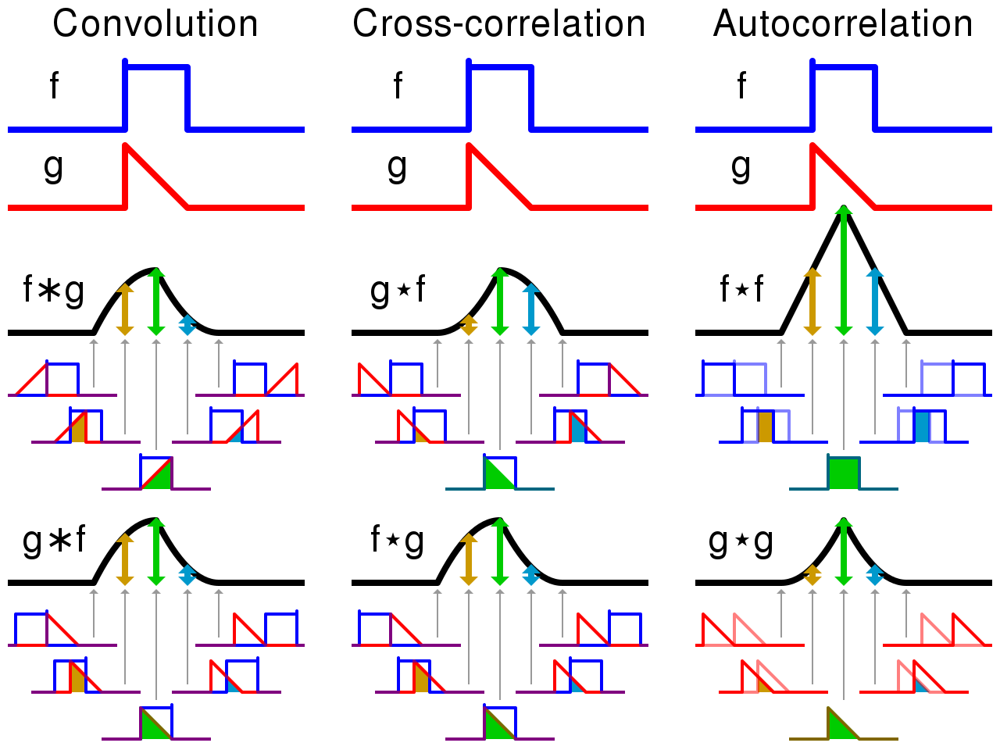

Exemplo da convolução sem espelhamento do Kernel:
https://www.deeplearningbook.org/contents/convnets.html

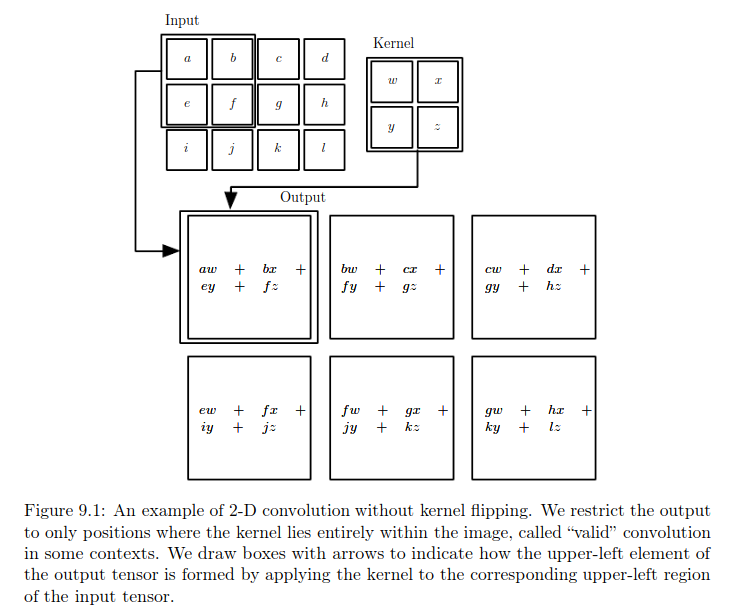

### Interações esparsas 

- Geralmente, os filtros (Kernel) são utilizados para realçar pequenos detalhes da imagem (Como bordas)
- Neste caso, o Kernel pode ser menor que a entrada
- Assim, tem-se menos parâmetros para treinar (Menos memória, mais eficiência no treino)

### Kernel

- Na prática, o Kernel é uma matriz que quando multplicada por uma imagem, realça determinadas características
- Nas CNN não é necessário programar o Kernel com determinados parâmetros, ele se configura sozinho
- Boa parte dos Kernels tendem aprender contornos (ou padrões) da imagem


Abaixo tem-se alguns exemplos de Kernels:

https://en.wikipedia.org/wiki/Kernel_(image_processing)

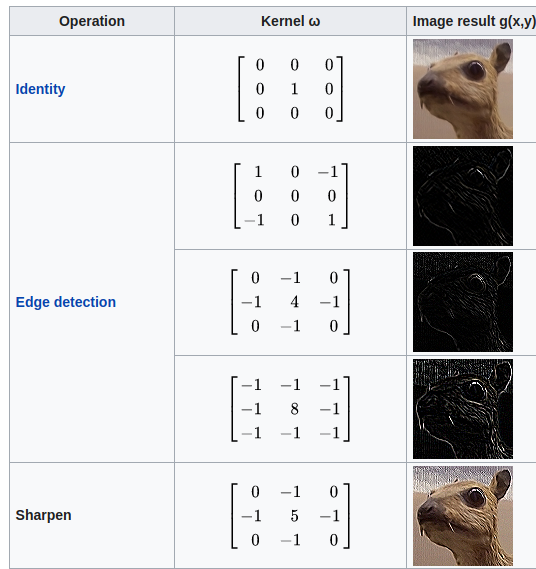

https://setosa.io/ev/image-kernels/

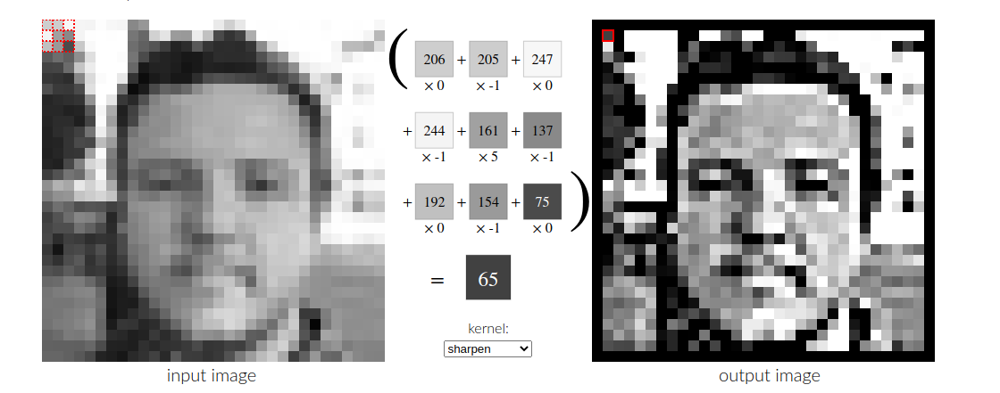

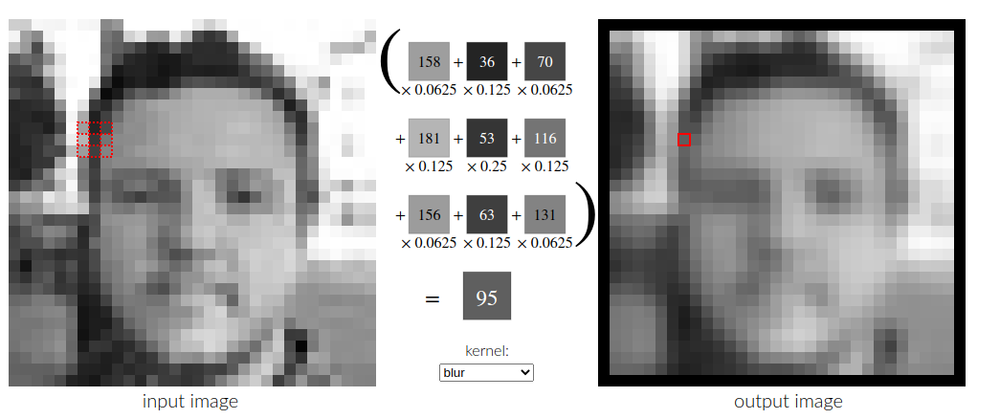

### Operação de convolução

Em resumo:

- Ao aplicar o kernel na imagem uma nova matriz é gerada (Mapa de característica)
- Cada célula da nova matriz corresponde à soma da multiplicação dos valores da matriz original pela matriz de Kernel
- O mapa de característica tem **dimensão menor** que a imagem de entrada:
    - A medida que a imagem se propaga na rede neural, há menos pixeis para ser processado
    - Desta forma, as CNNs reduz a imagem de forma ser mais fácil de processar, sem perder suas características

Abaixo é mostrado o procedimento:

https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

![image.png](https://miro.medium.com/max/2400/1*GcI7G-JLAQiEoCON7xFbhg.gif)

Para imagens com cor:

![imagem.png](https://miro.medium.com/max/700/1*ciDgQEjViWLnCbmX-EeSrA.gif)

 - Os maiores valores são gerados quando os dados são da matriz original é semelhante a matriz de Kernel
 
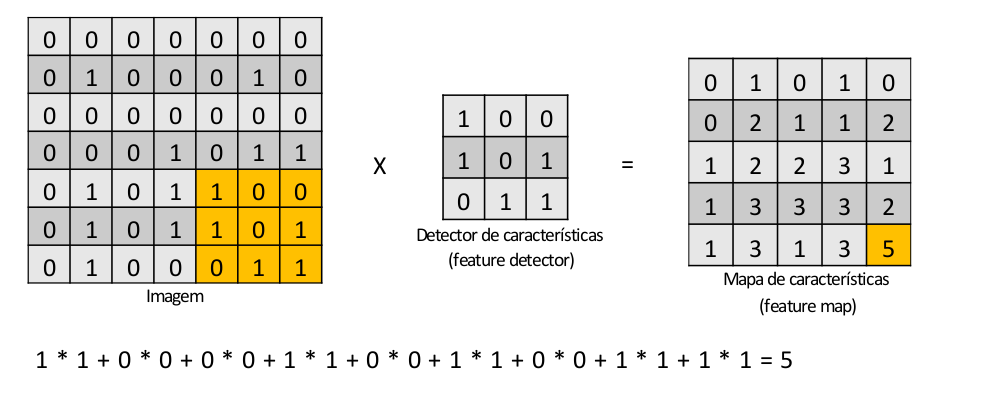

## Camada de convolução

- A cada camada de convolução a imagem fica menor (Efeito da convolução e Pooling)
- Uma camada de convolução é compostas por diversos filtros, ou seja, diversos mapas de características (Feature maps)
    - Um para o olho, outro para boca, etc
    - Cada diferente filtro resulta em um filtro de característica distinto
    - Em uma camada com 10 filtros e uma imagem com 32x32x3 (32x32 RGB), tem-se:
        - Cada filtro tem 5x5x3
        - Cada pixel de saída e cada filtro (5x5x3) resulta em 1x1x1
        - A saída da camada é 32x32x10 (10 mapas de características)
    
Exemplo de camada com 10 filtros e uma imagem com 32x32x3 (32x32 RGB):

https://towardsdatascience.com/applied-deep-learning-part-4-convolutional-neural-networks-584bc134c1e2

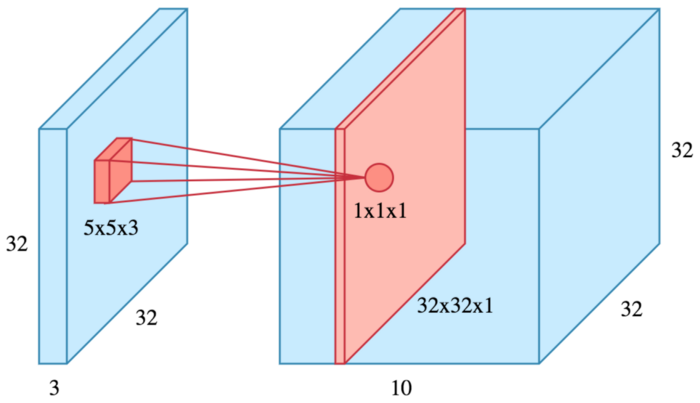
![image.png](https://miro.medium.com/max/700/1*ubmJTEy3edn5QYm5hNPmVg@2x.gif)
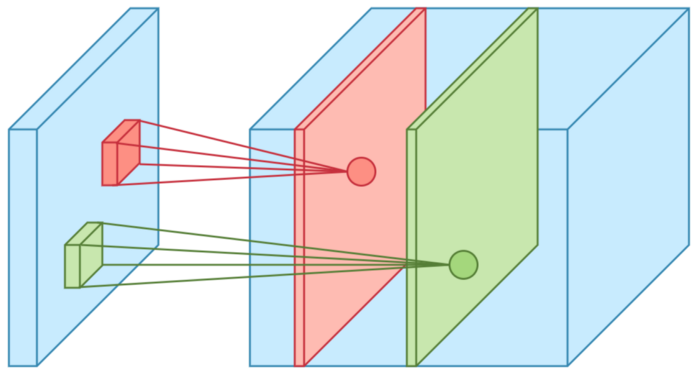


- Após obtidos os mapas de características, normalmente é aplica-se a função ReLU:
    - Valores negativos ficam zerados
    - Ressalta mais ainda os padrões
    - Variantes da ReLU podem ser utilizadas (Outras funções não são recomendadas, pois não ressaltam tanto os padrões)

Geralmente:
- As primeiras camadas convolucionais são resposáveis por capturar características de baixo nível, como bordas, cores, gradientes, etc
- As camadas posteriores identificam alterações de mais alto níveis, como partes de um objeto, partes do corpo (olho, boca, nariz, etc)
- Em resumo, cada camada pode aprender uma característica em particular

https://towardsdatascience.com/identifying-traffic-signs-with-deep-learning-5151eece09cb

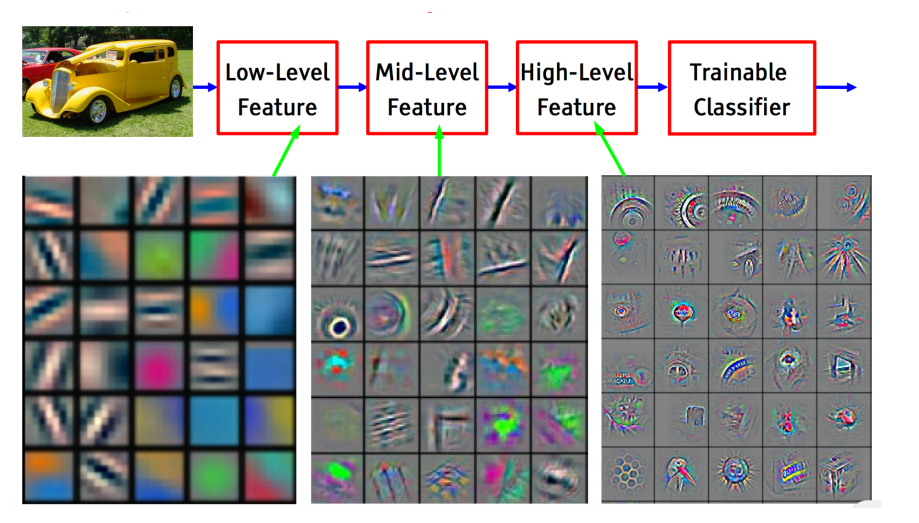

https://sci-hub.se/https://www.sciencedirect.com/science/article/abs/pii/S0031320319300640

Exemplo de filtro que identifica bolinhas:

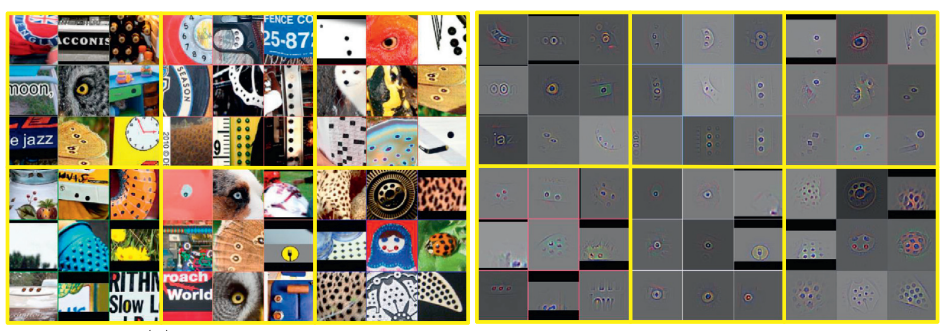

Exemplo de filtro que identifica listras:

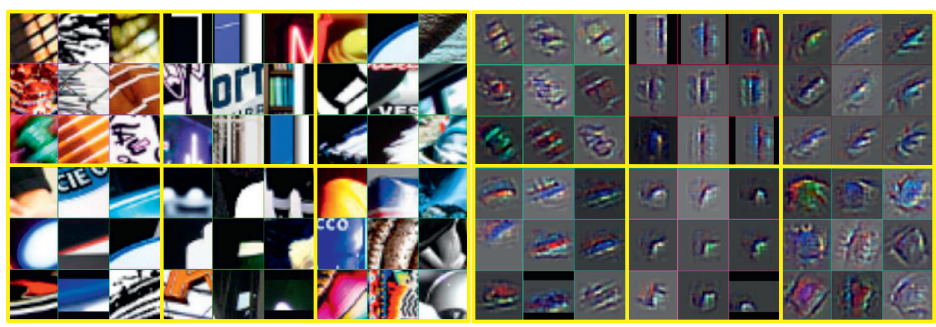

## Camada Pooling

Características:
- Seleciona ainda mais as características relevantes
- Elimina ruídos
- Diminui a dimensionalidade (O tamanho da matriz)

Procedimentos:
- Utiliza-se uma janela que se desloca ao longo da matriz de características
- É feita uma operação com os valores obtidos na janela
- Mais comum é o $\text{max}(\_)$:
    - Maior valor na janela
    - Ressalta características mais relevantes
- Outra opção é o valor médio, $\text{mean}(\_)$:
    - Valor médio da janela
    - Resalta a janela como um todo, mas reduzindo a quantidade de dados (Apenas reduz a imagem)
    
Exemplo:
https://towardsdatascience.com/applied-deep-learning-part-4-convolutional-neural-networks-584bc134c1e2
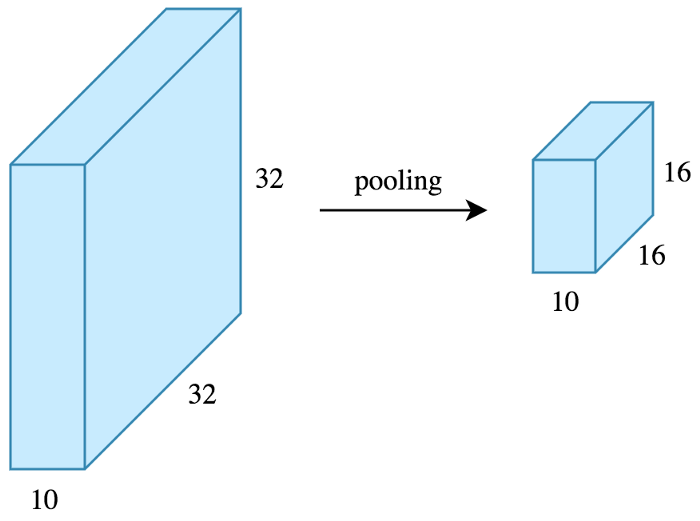

### Tipos de Pooling
Exemplo de max Pooling (Curso Udemy):
    
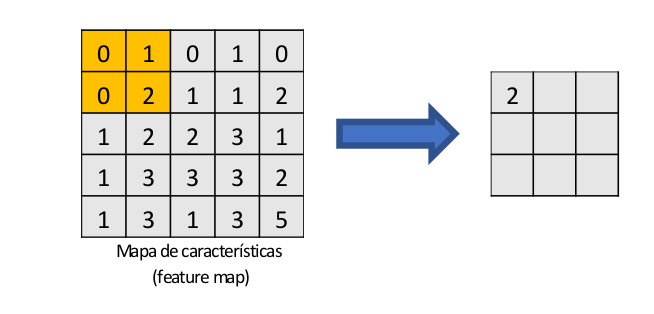
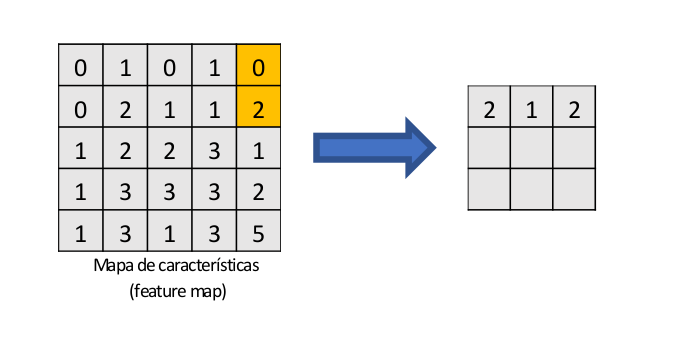
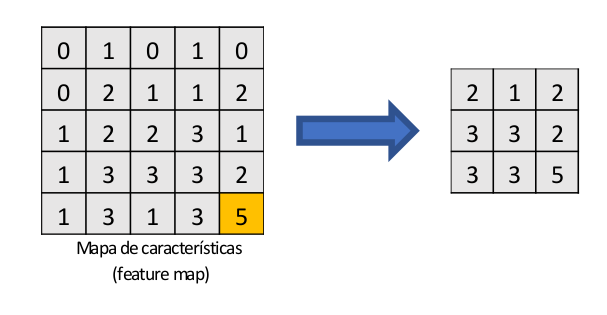

Max Pooling vs avg pooling:

https://pythonmachinelearning.pro/introduction-to-convolutional-neural-networks-for-vision-tasks/


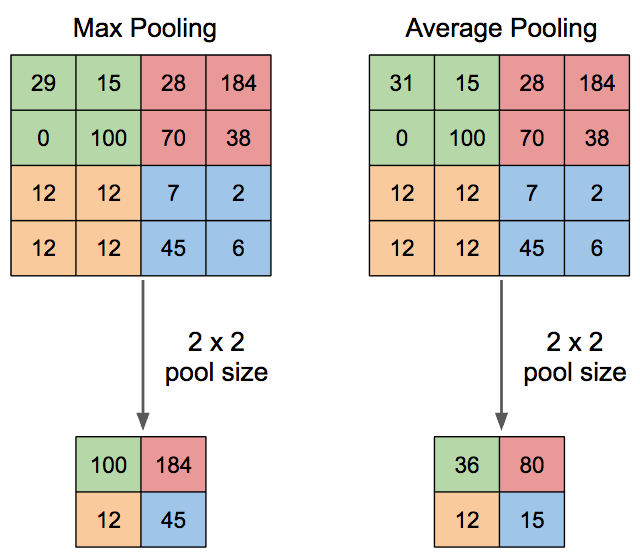


### Parâmetros do Pooling e das camadas de convolução

Caso a matriz não seja quadrada, preenche-se com zero para completar a matriz ou descarta a matriz.

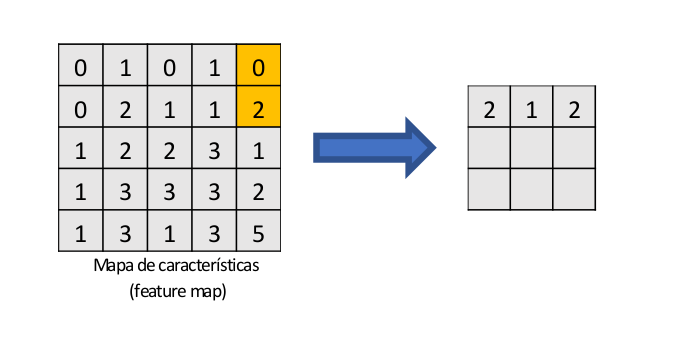

- Padding:
    - Same: Preenche com zero caso seja necessário
    - Valid: Caso não tenha valores suficientes, descarta a matriz
- Stride: Tamanho do deslocamento da matriz

Exemplo de parâmetros:

https://towardsdatascience.com/applied-deep-learning-part-4-convolutional-neural-networks-584bc134c1e2

Stride=1 e Padding=Valid (Sem Padding):
![image.png](https://miro.medium.com/max/700/1*L4T6IXRalWoseBncjRr4wQ@2x.gif)

Stride=2 e Padding=Valid (Sem Padding):
![image.png](https://miro.medium.com/max/700/1*L4T6IXRalWoseBncjRr4wQ@2x.gif)

Stride=1 e Padding=Same:
![image.png](https://miro.medium.com/max/700/1*W2D564Gkad9lj3_6t9I2PA@2x.gif)


### Mapas de características + Pooling

Curso Udemy

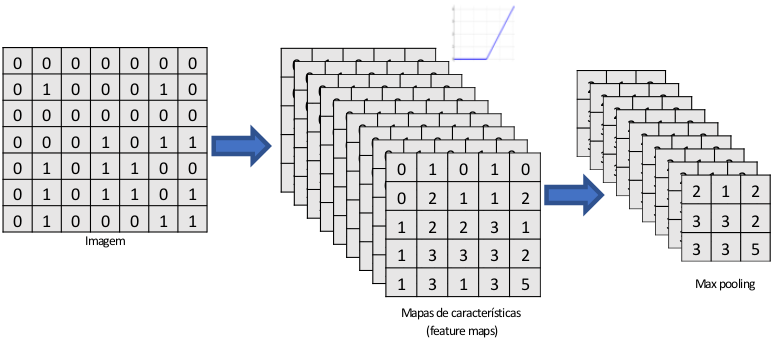

https://towardsdatascience.com/convolutional-neural-network-feature-map-and-filter-visualization-f75012a5a49c

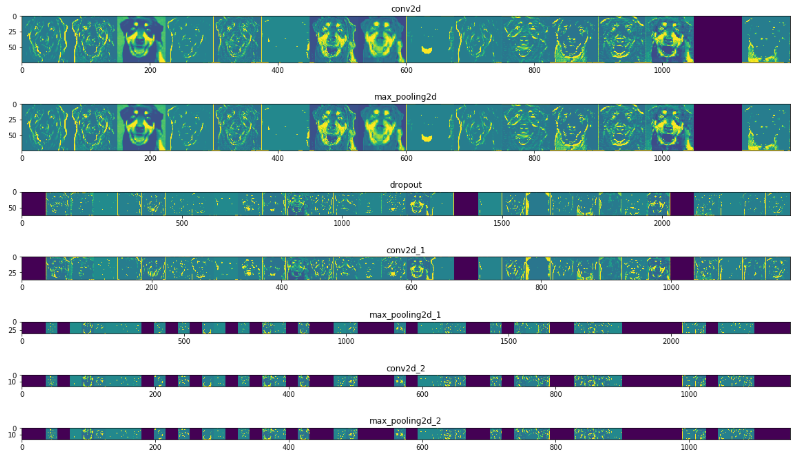

## Flattering e camada densa

## Flattering

- Transforma a matriz gerada pelo pooling em um vetor
- Passo posterior a aplicação da rede neural densa

Curso Udemy:

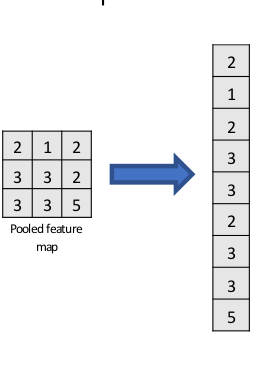

- No caso da CNN a entrada do Pooling é um volume (3 dimensões: Altura, largura e qtd de filtros)
- Ao final do Flatting todo volume é convertido em um vetor de 1 dimensão

### Rede Neural Densa (FFN)

- O vetor de Fletting serve de entrada para uma MLP (Multilayer Perceptron)
- Esta rede é responsável pela classificação da imagem já tratada pelas camadas de aprendizado de características

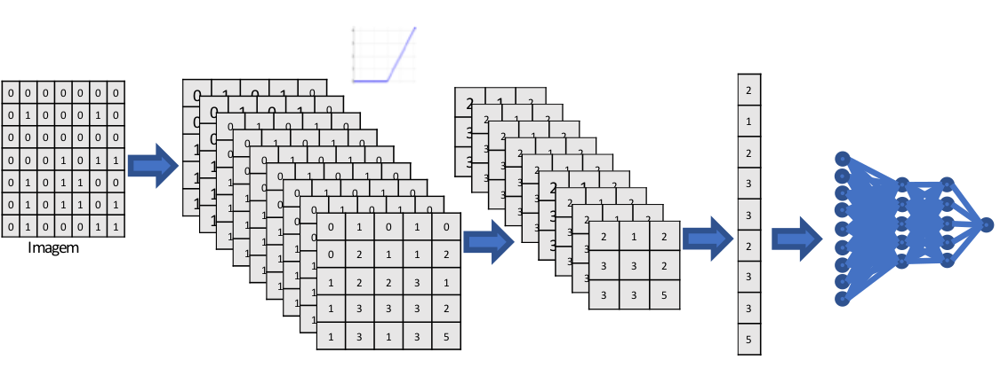

## Vantagens da CNN em relação a FFN

- Aprende automaticamente filtros para extrair características relevantes
- FFN são invariantes a translação
- FFN pode tentar extrair padrões não locais
    - CNN por conta dos filtros, considera padrões em pequenas seções da imagem (Mais eficiente)
        - A camada densa da CNN tem um input com menos valores por causa do sub-samppling

## Recomendações de parâmetros

https://towardsdatascience.com/applied-deep-learning-part-4-convolutional-neural-networks-584bc134c1e2

- Camadas de convolução:
    - Filter Size:
        - Geralmente 3x3
        - 5x5 ou 7x7 também podem ser usados
        - Filtros maiores tentam encontrar padrões "maiores"
    - Filter count:
        - Geralmente uma potência de 2 entre 32 e 1024
        - Usar mais filtros deixa o modelo mais robusto, mas com maior probabilidade de overffiting
        - Inicialmente começamos com poucos filtros (Características de baixo nível, como bordas, listras, etc)
        - Aumentamos a quantidade de filtros nas camadas mais internas
     - Stride: Valor padrão 1 (Desloca-se de 1 em 1)
     - Padding: Same
         - Usa o Padding
         - Preenche com zero as bordas
         - A altura e largura da entrada é igual a largura e altura da saída
- Camadas de subsamppling:
    - MaxPool2D: Max Pooling
    - Pool Size: (2x2) - Reduz a dimensão do mapa pela metade em altura e largura
    - Padding: Valid (Ou vazio)
    - Stride: (2x2) ou tamanho da imagem (Usar None)
    
Artigo com explicação matricial das redes neurais densas:

https://towardsdatascience.com/applied-deep-learning-part-1-artificial-neural-networks-d7834f67a4f6

# Primeira rede neural

## Importando as bibliotecas básicas

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

## Base de dados Cifar10

A base de dados (dataset) Cifar10 é uma base inclusa no Keras com 50 mil imagens coloridas de treino e 10 mil imagens de teste.

Cada imagem tem 10 categorias como mostra abaixo:

| Índice da classe | Nome em português | Nome em inglês |
| :--------------: | :---------------: | :------------: |
|        0         |       Avião       |    Airplane    |
|        1         |      Carros       |   Automobile   |
|        2         |      Pássaro      |      Bird      |
|        3         |       Gato        |      Cat       |
|        4         |       Cervo       |      Deer      |
|        5         |     Cachorro      |      Dog       |
|        6         |       Sapo        |      Frog      |
|        7         |      Cavalo       |     Horse      |
|        8         |       Barco       |      Ship      |
|        9         |     Caminhão      |     Truck      |

O site da base de dados é dado abaixo:

https://www.cs.toronto.edu/~kriz/cifar.html

### Nomeando as classes

In [2]:
class_names = ['Avião',
               'Carro',
               'Pássaro',
               'Gato',
               'Cervo',
               'Cachorro',
               'Sapo',
               'Cavalo',
               'Barco',
               'Caminhão'
              ]

### Carregando a base de dados

In [3]:
(x_train,Y_train),(x_test,Y_test) = tf.keras.datasets.cifar10.load_data()

Mosrando o shape das imagens:

In [4]:
def print_dataset_shape(x,name):
    shape=x.shape
    print(f'{name}: São {shape[0]} imagens, de {shape[1]}x{shape[2]} e {shape[-1]} canais. Shape: {shape}')

In [5]:
print_dataset_shape(x_train,'x_train')
print_dataset_shape(x_test,'x_test')

x_train: São 50000 imagens, de 32x32 e 3 canais. Shape: (50000, 32, 32, 3)
x_test: São 10000 imagens, de 32x32 e 3 canais. Shape: (10000, 32, 32, 3)


### Normalizando as imagens

Pré-processamento para aumentar o desempenho da rede neural.

In [6]:
def normalizar(x,name):
    print(f'[{name}]')
    print(f'Antes  -> Max:{x.max():5.3g} | Min: {x.min():5.3g} | Mean: {x.mean():5.3g}')
    x = x/255.0
    print(f'Depois -> Max:{x.max():5.3g} | Min: {x.min():5.3g} | Mean: {x.mean():5.3g}')
    return x

In [7]:
X_train = normalizar(x_train,'x_train')
X_test = normalizar(x_test,'x_test')

[x_train]
Antes  -> Max:  255 | Min:     0 | Mean:   121
Depois -> Max:    1 | Min:     0 | Mean: 0.473
[x_test]
Antes  -> Max:  255 | Min:     0 | Mean:   122
Depois -> Max:    1 | Min:     0 | Mean: 0.477


Visualizando o dataset:

In [8]:
def visualizar_dataset(x,y,labels,verb=False):
    fig, ax = plt.subplots(6,6,figsize=(12,12),sharey=True,sharex=True)
    # Gerar um índice aleatório de tamanho 36 (6x6)
    randi = np.random.randint(y.size,size=36)
    
    for j in range(6):
        for i in range(6):
            # Indice de saída
            class_index=int(y[randi[6*i+j]])
            # Título
            title = f'[{randi[6*i+j]}]: {labels[class_index]}-{class_index}' if verb else labels[class_index]
            # Plotar imagem
            ax[i,j].imshow(x[randi[6*i+j]],cmap=plt.cm.binary) #cmap=plt.cm.binary mostra a escala em preto e branco
            # Escrever título
            ax[i,j].set_title(title)
            # Removendo os eixos
            ax[i,j].set_yticks([])
            ax[i,j].set_xticks([])
    plt.tight_layout()

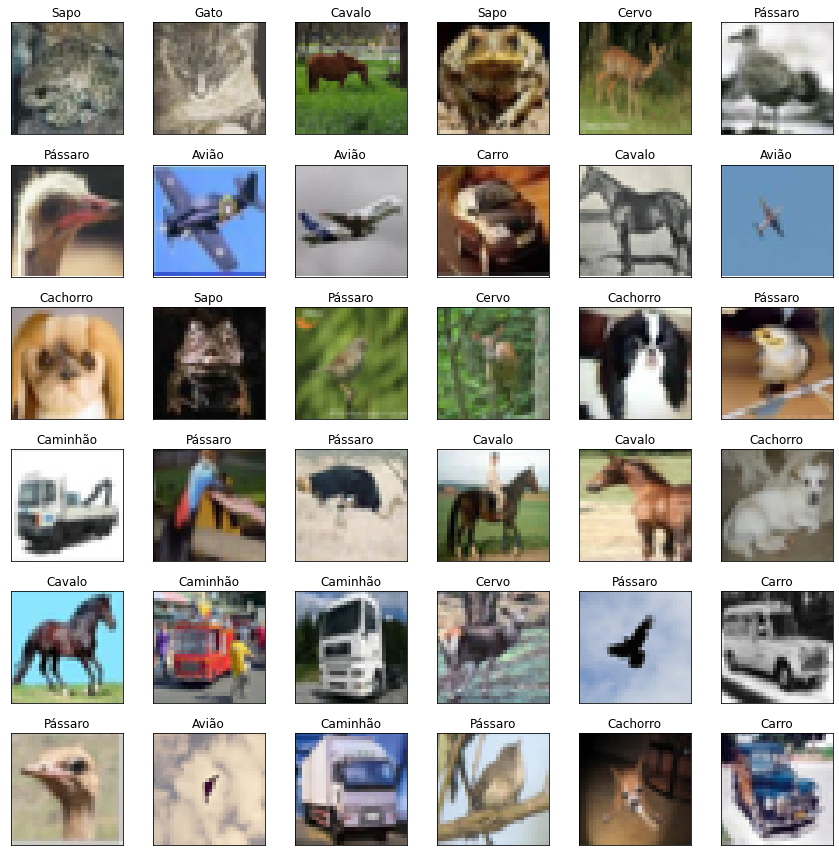

In [9]:
visualizar_dataset(X_train,Y_train,labels=class_names)

## Construção da rede neural

Para a construção da rede neural será utilizado o modelo apresentado em:

https://towardsdatascience.com/applied-deep-learning-part-4-convolutional-neural-networks-584bc134c1e2

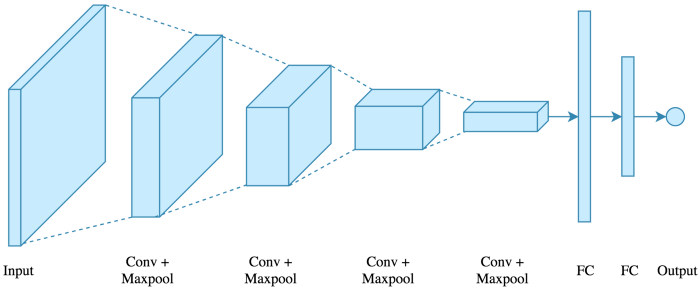

### Definindo o modelo sequencial

In [ ]:
model = tf.keras.models.Sequential()

### Camadas de aprendizado de característica

#### Primeira camada de convolução + Pooling

Hyper-parâmetros da camada de convolução:

- filters (qtd de mapas de características): 32
- kernel_size: (3x3)
- strides: 1 (1x1)
- padding: same (Preenche com zero as bordas da imagem)
- função de ativação: relu
- input_shape (camada de entrada): (32,32,3)

In [11]:
model.add(tf.keras.layers.Conv2D(
    filters=32, #Entre 32 a 1024 (Crescente)
    kernel_size=3, #(3x3) Geralmente 3 (Mas pode ser 5 ou 7)
    padding='same', #Preenche com zero as bordas da imagem (Não há redução da dimensão imagem)
    strides=1, #Desloca de 1 em 1 (Não é necessário colocar, pois este é o padrão)
    activation='relu', #ReLU é a mais indicada
    input_shape=(32,32,3), #Tamanho da imagem (incluindo os canais RGB)
    name='Conv1' #Nome da camada
))

Hyper-parâmetros do Pooling:

- Tipo de Pooling: MaxPool2D
- pool_size: 2 (2x2)
- strides: Tamanho da imagem (None)
- padding: Valid (Sem padding)

In [12]:
model.add(tf.keras.layers.MaxPool2D(
    pool_size=2, #(2x2)
    padding='Valid', #Não é necessário colocar pois o padrão é valid
    strides=None, #Deslocamento do tamanho do Pool_size (Não é necessário colocar pois este é o padrão)
    name='Pool1'
))

#### Segunda camada de convolução + Pooling

Camada de convolução:

- Omitiu-se o stride, pois o valor padrão já é (1x1)
- Omitiu-se o input_shape pois essa já é uma camada interna

Camada de Pooling:

- Omitiu-se o Padding e o Strides pois os valores padrão são `Valid` e `None`, respectivamente.

In [13]:
model.add(tf.keras.layers.Conv2D(
    filters=64, #Entre 32 a 1024 (Crescente)
    kernel_size=3, #(3x3) Geralmente 3 (Mas pode ser 5 ou 7)
    padding='same', #Preenche com zero as bordas da imagem (Não há redução da dimensão imagem)
    activation='relu', #ReLU é a mais indicada
    name='Conv2' #Nome da camada
))
model.add(tf.keras.layers.MaxPool2D(
    pool_size=2, #(2x2)
    name='Pool2'
))

#### Terceira camada de convolução + Pooling

Semelhante a anterior, mas com o número de filtros maior:

In [14]:
model.add(tf.keras.layers.Conv2D(
    filters=128, #Entre 32 a 1024 (Crescente)
    kernel_size=3, #(3x3) Geralmente 3 (Mas pode ser 5 ou 7)
    padding='same', #Preenche com zero as bordas da imagem (Não há redução da dimensão imagem)
    activation='relu', #ReLU é a mais indicada
    name='Conv3' #Nome da camada
))
model.add(tf.keras.layers.MaxPool2D(
    pool_size=2, #(2x2)
    name='Pool3'
))

#### Quarta camada de convolução

Semelhante a anterior, mas com o número de filtros maior:

In [15]:
model.add(tf.keras.layers.Conv2D(
    filters=128, #Entre 32 a 1024 (Crescente)
    kernel_size=3, #(3x3) Geralmente 3 (Mas pode ser 5 ou 7)
    padding='same', #Preenche com zero as bordas da imagem (Não há redução da dimensão imagem)
    activation='relu', #ReLU é a mais indicada
    name='Conv4' #Nome da camada
))

#### Flatten

Transforma os mapas de características da última camada em um vetor 1D

In [16]:
model.add(tf.keras.layers.Flatten())

#### Rede neural densa

Similar ao notebook anterior, com camada de saída com softmax com 10 neurônios:

In [17]:
model.add(tf.keras.layers.Dense(
    units=512, #512 neurônios
    activation='relu', 
    name='Dense1'
))

model.add(tf.keras.layers.Dense(
    units=128, #128 neurônios
    activation='relu', 
    name='Dense2'
))
model.add(tf.keras.layers.Dense(
    units=10, #10 neurônios
    activation='softmax', 
    name='Output'
))

### Visualizando a rede neural

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv1 (Conv2D)               (None, 32, 32, 32)        896       
_________________________________________________________________
Pool1 (MaxPooling2D)         (None, 16, 16, 32)        0         
_________________________________________________________________
Conv2 (Conv2D)               (None, 16, 16, 64)        18496     
_________________________________________________________________
Pool2 (MaxPooling2D)         (None, 8, 8, 64)          0         
_________________________________________________________________
Conv3 (Conv2D)               (None, 8, 8, 128)         73856     
_________________________________________________________________
Pool3 (MaxPooling2D)         (None, 4, 4, 128)         0         
_________________________________________________________________
Conv4 (Conv2D)               (None, 4, 4, 128)         1

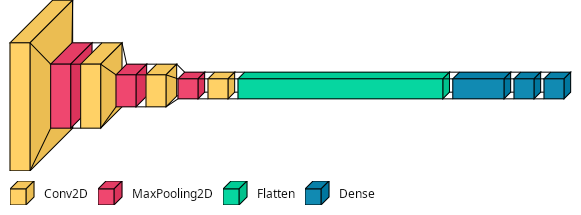

In [19]:
import visualkeras
from PIL import ImageFont #Carrega o módulo de fonte para imagem

font = ImageFont.truetype("NotoSans-Regular.ttf", 12)  # using comic sans is strictly prohibited!

visualkeras.layered_view(model,to_file='model_cnn_test.png',legend=True, font=font)

### Compilando a rede neural

Será utilizado os mesmos parâmetros da rede neural do notebook anterior

In [20]:
model.compile(loss="sparse_categorical_crossentropy",optimizer="Adam",metrics=["sparse_categorical_accuracy"])

### Treinando o modelo

In [21]:
history = model.fit(X_train,Y_train,epochs=30,validation_data=(X_test,Y_test))

Epoch 1/30
1563/1563 [==============================] - 29s 18ms/step - loss: 1.4154 - sparse_categorical_accuracy: 0.4792 - val_loss: 1.0767 - val_sparse_categorical_accuracy: 0.6149
Epoch 2/30
1563/1563 [==============================] - 28s 18ms/step - loss: 0.9765 - sparse_categorical_accuracy: 0.6525 - val_loss: 0.8645 - val_sparse_categorical_accuracy: 0.6962
Epoch 3/30
1563/1563 [==============================] - 28s 18ms/step - loss: 0.7826 - sparse_categorical_accuracy: 0.7234 - val_loss: 0.8564 - val_sparse_categorical_accuracy: 0.7058
Epoch 4/30
1563/1563 [==============================] - 28s 18ms/step - loss: 0.6459 - sparse_categorical_accuracy: 0.7731 - val_loss: 0.8474 - val_sparse_categorical_accuracy: 0.7163
Epoch 5/30
1563/1563 [==============================] - 28s 18ms/step - loss: 0.5447 - sparse_categorical_accuracy: 0.8074 - val_loss: 0.7890 - val_sparse_categorical_accuracy: 0.7375
Epoch 6/30
1563/1563 [==============================] - 28s 18ms/step - loss: 0.

## Validando a rede neural

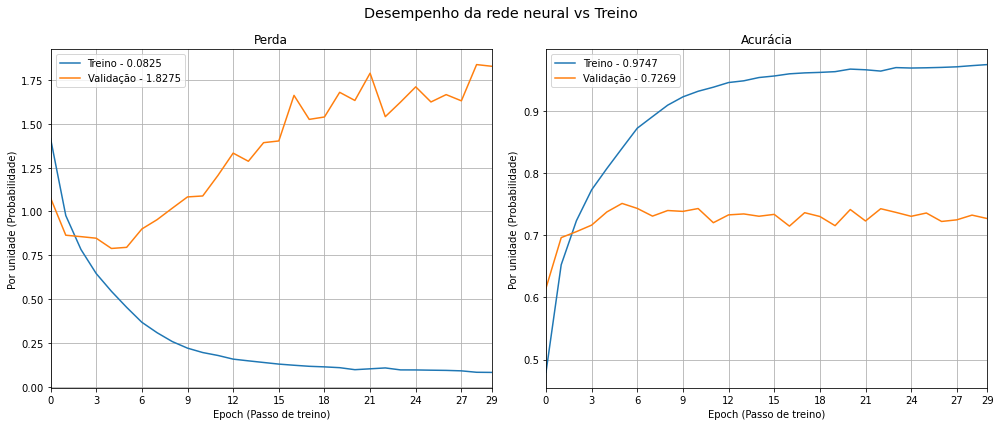

In [22]:
fig, ax = plt.subplots(1,2,figsize=(14,6))

keys = {"loss":"Treino","val_loss":"Predito"}

for i, ax in enumerate(ax):
    for j, key in zip(np.arange(0,3,2)+i,history.history.keys()):
        data = np.array(list(history.history.values())[j])
        key = list(history.history.keys())[j]
        ax.plot(data,label=("Validação" if "val" in key else "Treino")+f' - {data[-1]:.4f}')
        ax.legend()
        ax.grid(True)
        ax.set_xticks(np.r_[np.arange(0,data.size,np.round(data.size/10)),data.size-1])
        ax.set_xlim(0,data.size-1)
        ax.set_xlabel('Epoch (Passo de treino)')
        ax.set_ylabel('Por unidade (Probabilidade)')
        ax.set_title(('Acurácia' if "accuracy" in key else "Perda"))
fig.suptitle('Desempenho da rede neural vs Treino',fontsize='x-large');
plt.tight_layout();

Calculando as predições:

In [23]:
Predictions=model.__call__(X_test).numpy().argmax(axis=1)
Predictions

array([3, 8, 8, ..., 5, 1, 7])

Métricas do Sklearn:

In [24]:
import sklearn

In [25]:
from sklearn.metrics import confusion_matrix

Matriz de confusão:

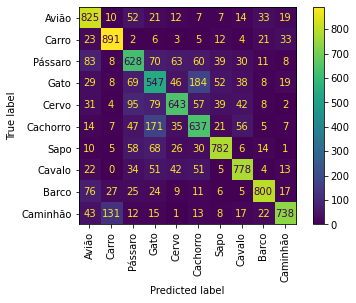

In [26]:
confusion_matrix=sklearn.metrics.confusion_matrix(Y_test, #Valores reais
                                                  Predictions, #Valores preditos
                                                  normalize=None
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Matriz de confusão normalizada:

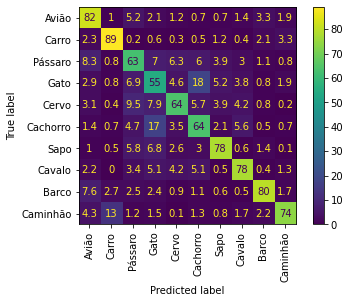

In [27]:
confusion_matrix=sklearn.metrics.confusion_matrix(Y_test, #Valores reais
                                                  Predictions, #Valores preditos
                                                  normalize='true'
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix*100, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Classification Report

In [725]:
print(np.array([0.71,0.82,0.61,0.52,0.73,0.60,0.81,0.79,0.86,0.86]).mean())
print(np.array([0.82,0.89,0.63,0.55,0.64,0.64,0.78,0.78,0.80,0.74]).mean())
print(np.array([0.77,0.85,0.62,0.53,0.68,0.62,0.79,0.78,0.83,0.79]).mean())

0.7310000000000001
0.7270000000000001
0.7260000000000001


In [29]:
print(sklearn.metrics.classification_report(Y_test, #Valores reais
                                            Predictions, # Valores preditos
                                            target_names=class_names # Nome das Labels
                                           ))

              precision    recall  f1-score   support

       Avião       0.71      0.82      0.77      1000
       Carro       0.82      0.89      0.85      1000
     Pássaro       0.61      0.63      0.62      1000
        Gato       0.52      0.55      0.53      1000
       Cervo       0.73      0.64      0.68      1000
    Cachorro       0.60      0.64      0.62      1000
        Sapo       0.81      0.78      0.79      1000
      Cavalo       0.79      0.78      0.78      1000
       Barco       0.86      0.80      0.83      1000
    Caminhão       0.86      0.74      0.79      1000

    accuracy                           0.73     10000
   macro avg       0.73      0.73      0.73     10000
weighted avg       0.73      0.73      0.73     10000



In [30]:
def visualizar_dataset_predito(x,y,y_pred,labels,verb=False):
    fig, ax = plt.subplots(6,6,figsize=(12,12),sharey=True,sharex=True)
    # Gerar um índice aleatório de tamanho 36 (6x6)
    randi = np.random.randint(y.size,size=36)
    perda=0
    acuracia=0
    for j in range(6):
        for i in range(6):
            # Indice de saída
            y_=int(y[randi[6*i+j]])
            y_p=int(y_pred[randi[6*i+j]])
            # Título
            title = f'[{randi[6*i+j]}]: {labels[y_p]}-{y_p}-{y_}' if verb else f'{labels[y_p]}{f" | {labels[y_]}" if y_p!=y_ else""}'
            # Plotar imagem
            ax[i,j].imshow(x[randi[6*i+j]],cmap=plt.cm.binary) #cmap=plt.cm.binary mostra a escala em preto e branco
            # Escrever título
            ax[i,j].set_title(title)
            # Removendo os eixos
            ax[i,j].set_yticks([])
            ax[i,j].set_xticks([])
            perda += int(y_ != y_p)
            acuracia += int(y_ == y_p)
    fig.suptitle(f'Perda: {perda/36:.3f} ({perda}/36) | Acurácia: {acuracia/36:.3f} ({acuracia}/36)',fontsize='x-large')
    plt.tight_layout()

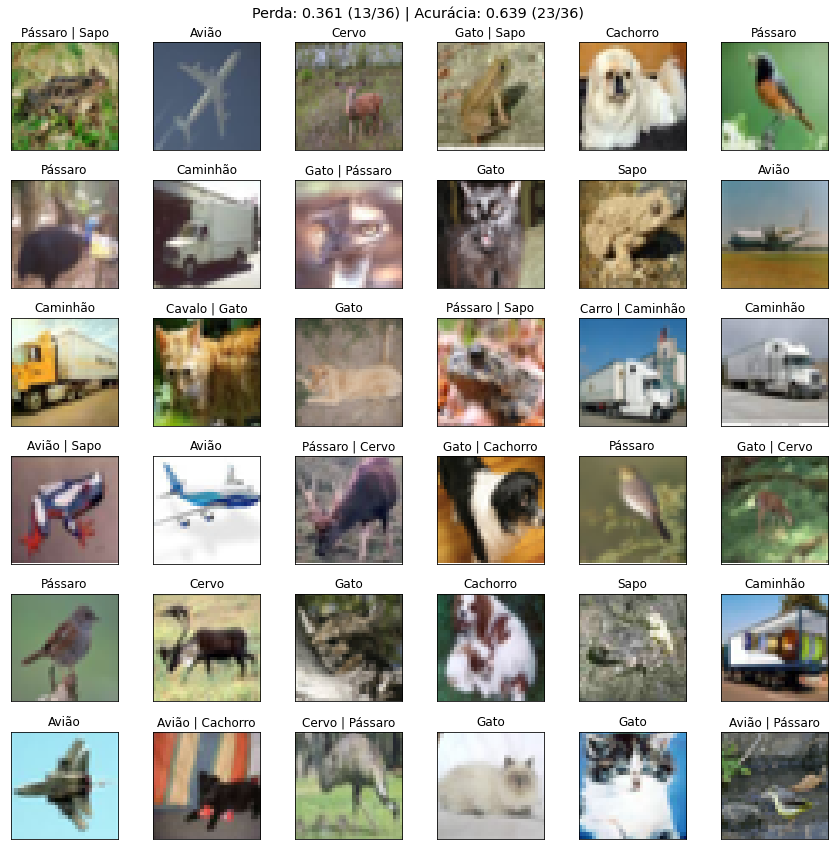

In [696]:
visualizar_dataset_predito(X_test,Y_test,Predictions,class_names)

**Conclusão:** Depois da terceira época a rede Neural começa a divergir. Os possíveis motivos são:

- **Baixa quantidade de dados** $\rightarrow$ Uma rede neural precisa de uma grande quantidade de dados para funcionar corretamente
- **Overfitting** $\rightarrow$ Os dados se ajustaram muito bem aos dados de treino que não consegue classificar os dados de teste

# Gerador de imagens

- O Keras tem uma série de recursos de pre-processamento de imagens

- Estes recursos podem ser acessados no submódulo `tensorflow.keras.preprocessing.image`

- Um dos recursos mais interessantes é o **gerador de imagens**
    - Gera imagens com pré-processamento
    - Gera imagens em lotes (`batch`)
    - Permite a criação novos dados de forma artificial
    
Mais detalhes:

https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

Vamos importar o `ImageDataGenerator` (Classe do gerador de imagens):

In [126]:
# Importa o gerador de imagens
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## Gerador a partir de arrays

Criando o gerador de imagens com:

- `rescale` (Normalização) $\rightarrow$ Divide os valores por um determinado valor
    - Para obter valores entre 0 e 1
    - Normalmente usa-se `1/255.0`
- Base de dados `cifar10`

In [127]:
# Criando o generator
datagen = ImageDataGenerator(rescale=1/255.0)

In [128]:
# Carregando a base de dados
(x,y),(x_val,y_val) = tf.keras.datasets.cifar10.load_data()

- O gerador de imagens gera a base de dados em lotes
- Através do método `flow` (Fluxo)

Considerando um lote (`batch`) de 48 imagens, pode-se criar um iterável de treino e validação:

In [184]:
# Criando o iterável de treino
train = datagen.flow(x=x, #Imagem
                     y=y, #Resposta
                     batch_size=48, #Tamanho do lote (batch)
                     shuffle=True #Embaralha os dados
                    )
# Criando o iterável de validação
validation = datagen.flow(x=x_val, #Imagem
                          y=y_val, #Resposta
                          batch_size=48, #Tamanho do lote (batch)
                          shuffle=True #Embaralha os dados
                         )

Os iteráveis são organizados da seguinte forma:

$$
\text{dataset} \rightarrow
\begin{cases}
    \text{Batch[0]}\rightarrow
    \begin{cases}
        \text{[0]:Imagens}\rightarrow
        \begin{cases}
            \text{Imagem[0]}\\
            \vdots\\
            \text{Imagem[m]}
        \end{cases}
        \\
        \text{[1]:Saídas}\rightarrow
        \begin{cases}
            \text{Saída[0]}\\
            \vdots\\
            \text{Saída[m]}
        \end{cases}
    \end{cases}
    \\
    \vdots\\
    \text{Batch[n]}\rightarrow
    \begin{cases}
        \text{[0]:Imagens}\rightarrow
        \begin{cases}
            \text{Imagem[0]}\\
            \vdots\\
            \text{Imagem[m]}
        \end{cases}
        \\
        \text{[1]:Saídas}\rightarrow
        \begin{cases}
            \text{Saída[0]}\\
            \vdots\\
            \text{Saída[m]}
        \end{cases}
    \end{cases}
\end{cases}
$$
onde:
- $n$ é o número de lotes
- $m$ é o tamanho de cada lote

Nos datasets de treino e teste, tem-se:

In [185]:
def printIterDim(flow,name):
    print(f'Dataset: {name}')
    print(f'- {len(flow)} lotes (Batchs)') #A primeira dimensão é o lote
    print(f'- {len(flow[0][0])} imagens por lote') #Acessando as imagens do lote zero
    print(f'- {len(flow[0][1])} saídas por lote') #Acessando as saídas do lote zero
    print(f'- Dimensão das imagens {flow[0][0][0].shape}') #Acessando a primeira imagem do lote zero
    print(f'- Dimensão das saídas {flow[0][1][0].shape}') #Acessando a primeira saída do lote zero

In [186]:
printIterDim(train,'Treino')
printIterDim(validation,'Teste')

Dataset: Treino
- 1042 lotes (Batchs)
- 48 imagens por lote
- 48 saídas por lote
- Dimensão das imagens (32, 32, 3)
- Dimensão das saídas (1,)
Dataset: Teste
- 209 lotes (Batchs)
- 48 imagens por lote
- 48 saídas por lote
- Dimensão das imagens (32, 32, 3)
- Dimensão das saídas (1,)


Selecionando um lote aleatoriamente:

In [197]:
def displayBatch(datagen,dim=(6,8),figsize=None,classes=None,title=None):
    if figsize==None:
        figsize=(2*dim[1],2*dim[0])
    fig, ax = plt.subplots(dim[0],dim[1],figsize=figsize,sharex=True,sharey=True)
    
    randi = int(np.random.randint(len(datagen)))
    
    for ax, x, y in zip(ax.flat,datagen[randi][0],datagen[randi][1]):
        ax.imshow(x)
        ax.set_xticks([])
        ax.set_yticks([])
        if classes:
            ax.set_title(classes[int(y)])
    if title:
        plt.suptitle(title+f' - Batch no. {randi}',fontsize='x-large')
    plt.tight_layout()

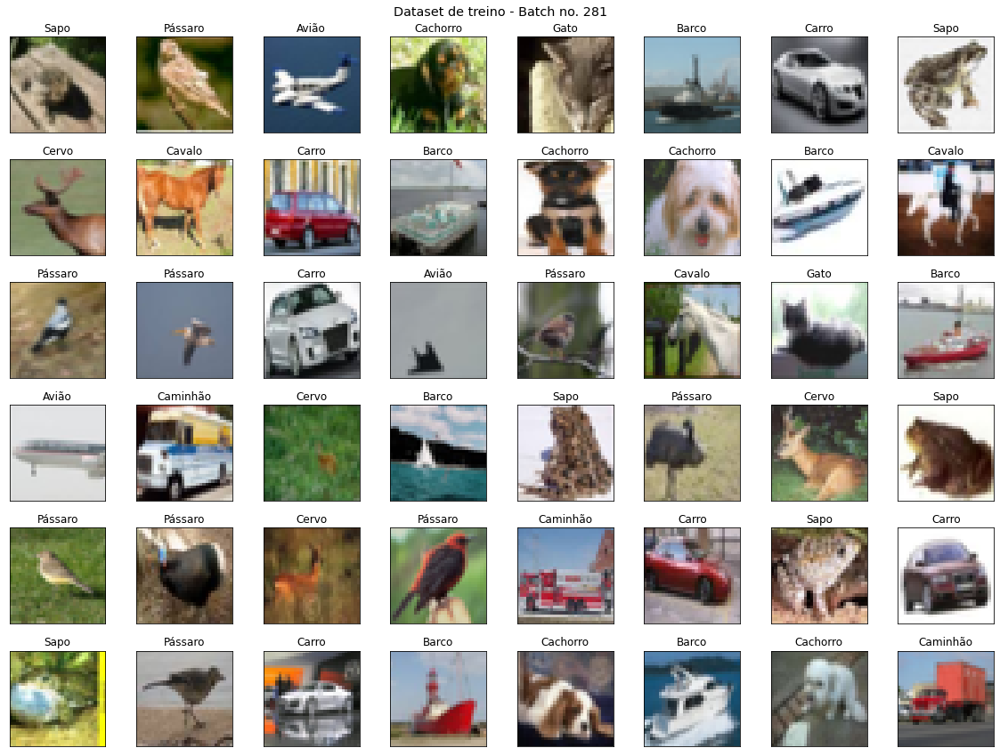

In [203]:
displayBatch(train,classes=class_names,title='Dataset de treino')

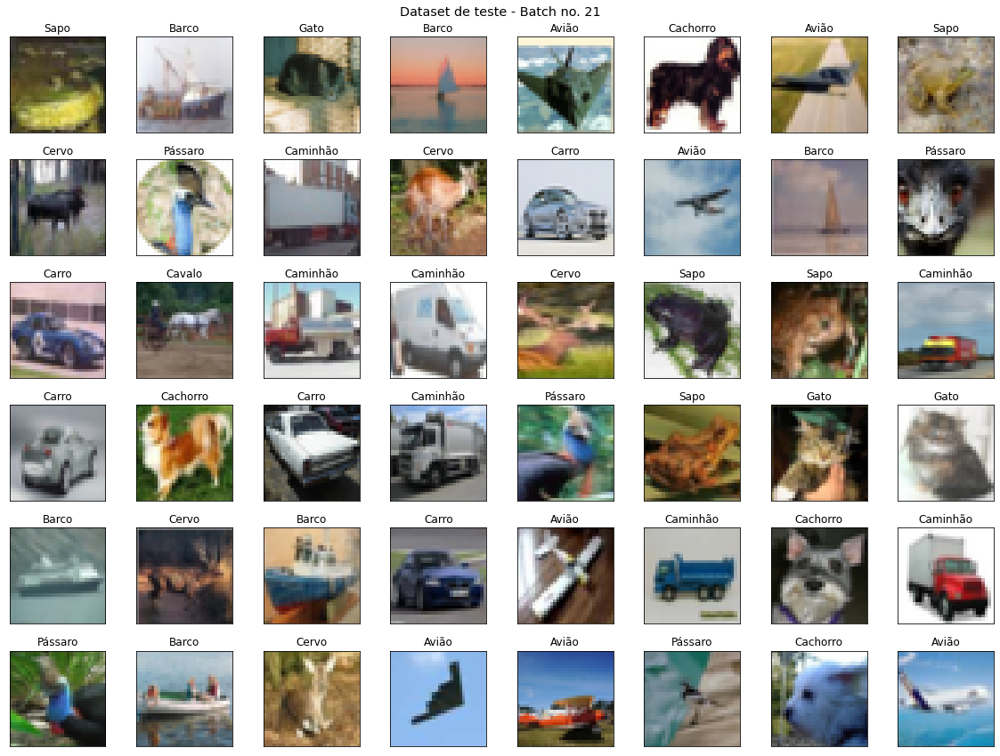

In [200]:
displayBatch(validation,classes=class_names,title='Dataset de teste')

### Gerador a partir de pastas

Será criado um gerador de imagens com:

- `rescale` (Normalização) $\rightarrow$ Divide os valores por um determinado valor
    - Para obter valores entre 0 e 1
    - Normalmente usa-se `1/255.0`
- `validation_split` $\rightarrow$ Separa uma fração das imagens para validação
    - Valor entre 0 e 1
    - Exemplo: `0.2` resulta em 20% das imagens para treino e 80% para validação
    - As imagens de validação serão as últimas e as de treino serão as primeiras

https://towardsdatascience.com/addressing-the-difference-between-keras-validation-split-and-sklearn-s-train-test-split-a3fb803b733
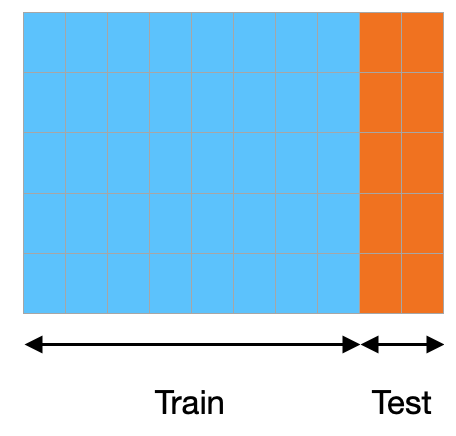

- Será utilizado o `dataset` de `Dogs vs Cats` do Kaggle:
    - https://www.kaggle.com/c/dogs-vs-cats/data

In [700]:
# Criando o generator
datagen = ImageDataGenerator(
                            rescale=1/255.0, #Normalização
                            validation_split=0.2 #Separa os dados 
                            )

É possível criar um iterável a partir de uma pasta utilizando o método `flow_from_directory`.

Os argumentos desse método são:
- `diectory` (Diretório) $\rightarrow$ Caminho do diretório que contém as imagens
- `batch` (Lote) $\rightarrow$ Tamanho do lote
- `subset` (Conjunto) $\rightarrow$ Pode ser `training` ou `validation`
- `target_size` (Tamanho da imagem) $\rightarrow$ Padroniza as imagens em um único tamanho
- `classmode` (Tipo de classe) $\rightarrow$ Como as classes estão organizadas
    - `binary` $\rightarrow$ Classe Binária (Duas categorias - 0 ou 1)
    - `categorical` $\rightarrow$ Mais de uma categoria (Binária one-hot)
    - `sparse` $\rightarrow$ Classe representada por inteiro
    - `input` $\rightarrow$ Entrada identica à saída (Usada em autoencoders)
- `shuffle` (Embaralhar) $\rightarrow$ Verdadeiro ou Falso

In [701]:
# Criando o iterável de treino
train_generator = datagen.flow_from_directory(
    directory = './PetImages', #Caminho do diretório
    batch_size=48, #Tamanho do lote (batch)
    shuffle=True, #Embaralha os dados
    target_size=(64,64), #Tamanho da imagem
    class_mode='binary', #Classificação binária
    subset='training', #Conjunto de dados para treino
)
# Criando o iterável de validação
validation_generator = datagen.flow_from_directory(
    directory = './PetImages', #Caminho do diretório
    batch_size=48, #Tamanho do lote (batch)
    shuffle=True, #Embaralha os dados
    target_size=(64,64), #Tamanho da imagem
    class_mode='binary', #Classificação binária
    subset='validation', #Conjunto de dados para validação
)

Found 20001 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


In [702]:
classes_names=('Cat','Dog')

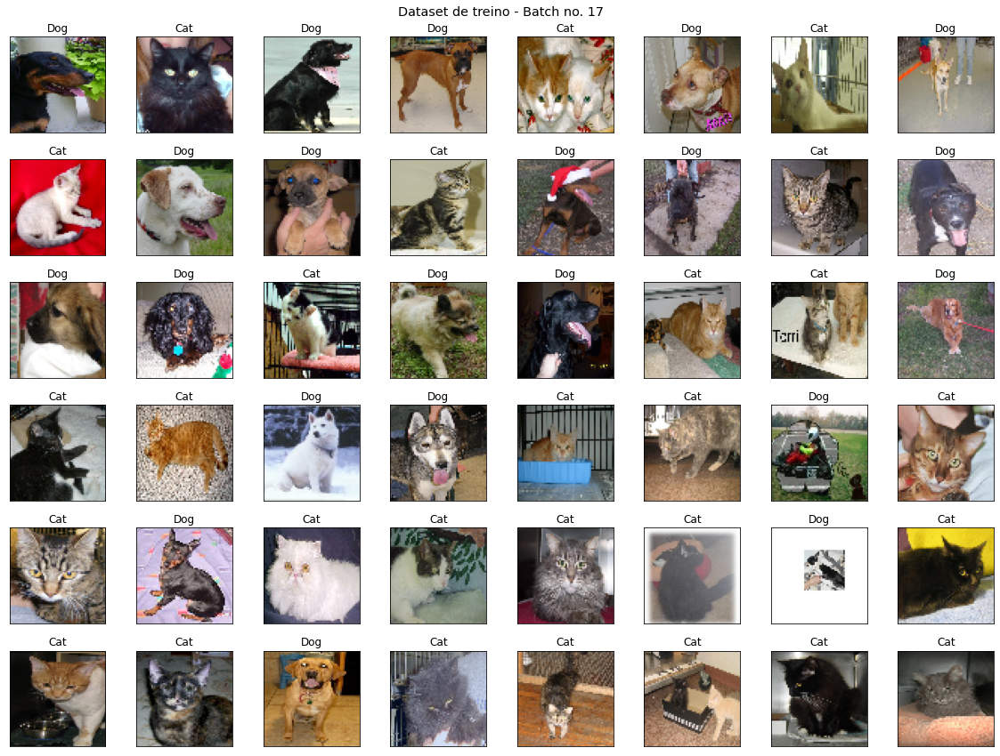

In [705]:
displayBatch(train_generator,classes=classes_names,title='Dataset de treino')

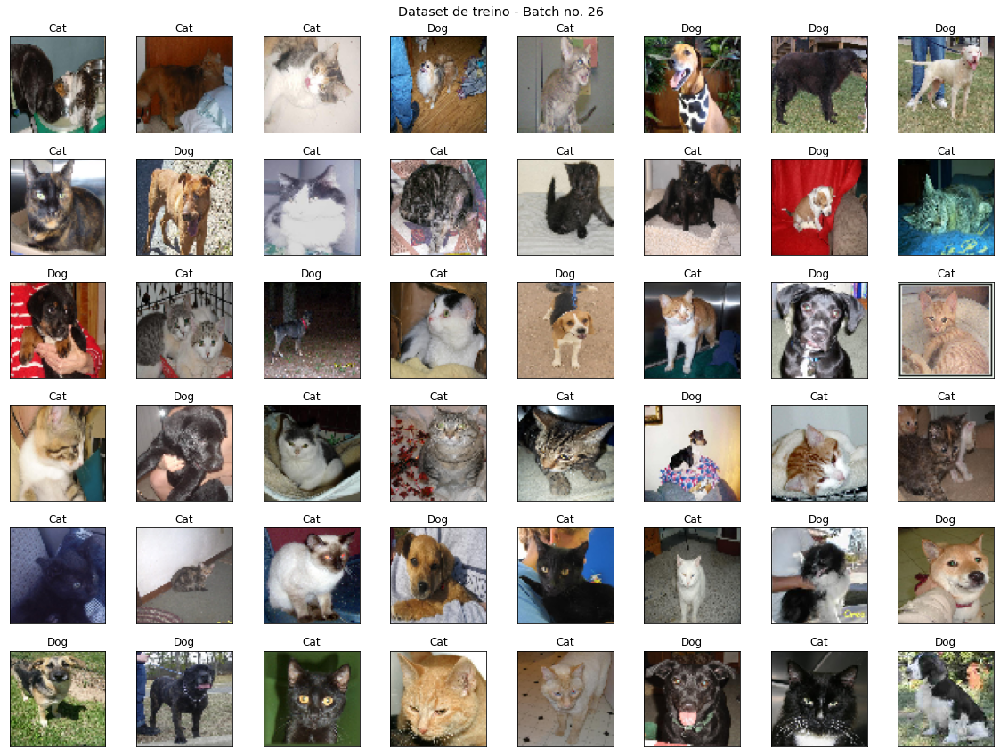

In [704]:
displayBatch(validation_generator,classes=classes_names,title='Dataset de treino')

# Aumento de imagens (Image data aumentation)

Contexto:
- As redes neurais tendem aumentar a perfomance com o aumento do volume de dados
    - 1000 imagens por categoria é pouco para um treinamento eficiente
- Muitas vezes a base dados não tem tantas imagens rotuladas como deveria
- Neste caso, pode-se utilizar o **aumento artificial de dados**

O aumento de imagens consiste em pegar a imagem original e gerar novas imagens a partir dessas através de:
- Rotação
- Alteração do brilho
- Deslocamento
- Zoom
- Etc

## Exemplo

https://medium.com/analytics-vidhya/data-augmentation-in-deep-learning-3d7a539f7a28

Carregando o submódulo preprocesssing.imagem do Keras

In [33]:
import tensorflow.keras.preprocessing.image as preprocessing

Carregando a imagem:

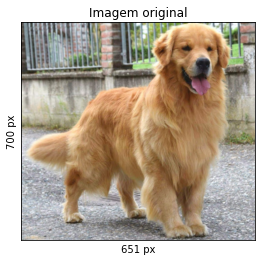

In [92]:
#Carregando a imagem da internet
img = preprocessing.load_img('dog.png')
plt.imshow(img);
plt.yticks([]);
plt.xticks([]);
dim=preprocessing.img_to_array(img).shape
plt.title('Imagem original');
plt.xlabel(f'{dim[0]} px');
plt.ylabel(f'{dim[1]} px');

### Deslocamento horizontal

O Keras tem uma classe chamada `ImageDataGenerator` para a configuração de pre-processamento do dataset aumentado.

Todas as opções podem ser vistas aqui:

https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

Vamos usar o `ImageDataGenerator` para gerar deslocamento aleatório de $\pm25\%$ da imagem original.

- Criando as configurações de pre-processamento do dataset aumentado:

In [93]:
xshift=int(0.25*dim[0])

# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(width_shift_range=[-xshift,xshift])

- Transformando a imagem em um array:

In [94]:
# Transformando a imagem em um array
data = preprocessing.img_to_array(img)
print(f'Dimensão da imagem: {data.shape}')

Dimensão da imagem: (651, 700, 3)


- Colocando a imagem dentro de um dataset com um único elemento:

In [95]:
# Aumentando o vetor de imagem em uma dimensão
dataset = np.expand_dims(data,0)
print(f'Dimensão do dataset: {dataset.shape}')

Dimensão do dataset: (1, 651, 700, 3)


Aplicando a transformação definida em `datagen` no `dataset`:

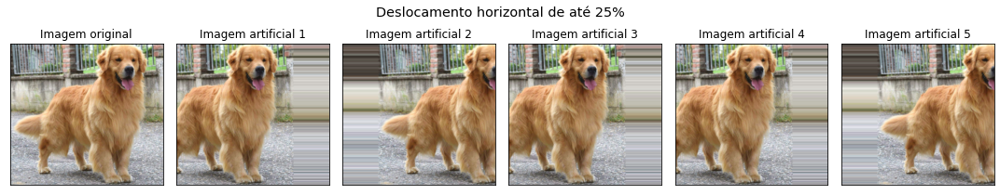

In [96]:
# Criando um generator para gerar as imagens a partir da configuração do datagen

out = datagen.flow(dataset,
                   batch_size=6 # Gera 6 imagens em lote
                  )


# Plotando o dataset aumentado com 6 elementos
fig, ax = plt.subplots(1,6,figsize=(15,3))

# Plotagem

ax[0].imshow(img)
ax[0].set_xticks([]);
ax[0].set_yticks([]);
ax[0].set_title('Imagem original');
for i in range(1,6):
    batch = out.next() #Carregando o próximo minibatch do generator
    image = batch[0].astype('uint8') #Carregando o primeiro elemento do minibatch
    ax[i].imshow(image)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(f'Imagem artificial {i}');
plt.suptitle('Deslocamento horizontal de até 25%',fontsize='x-large');
plt.tight_layout()

Observe que o próprio algoritmo preenche a imagem com algumas cores da própria imagem.

### Deslocamento vertical

O procedimento é o mesmo do anterior, só muda o parâmetro de configuração.

In [214]:
def displayAugumentedDataset(datagen,img,dim=(1,6),figsize=None,title=None):
    # Transformando a imagem em um array
    data = preprocessing.img_to_array(img)
    
    # Colocando a imagem dentro de um dataset com um único elemento
    dataset = np.expand_dims(data,0)

    # Criando um generator para gerar as imagens a partir da configuração do datagen
    out = datagen.flow(dataset,batch_size=dim[0]*dim[1])

    # Plotagem
    if figsize==None:
        figsize=(2*dim[1],2*dim[0])
    fig, ax = plt.subplots(dim[0],dim[1],figsize=figsize)
    
    first = True
    
    for i, ax in enumerate(ax.flat):
        if i:
            batch = out.next()
            ax.imshow(batch[0].astype('uint8'))
            ax.set_title(f'Imagem artificial {i}')
        else:
            ax.imshow(img)
            ax.set_title(f'Imagem original')
        ax.set_xticks([])
        ax.set_yticks([])
    if title:
        plt.suptitle(title,fontsize='x-large')
    plt.tight_layout()

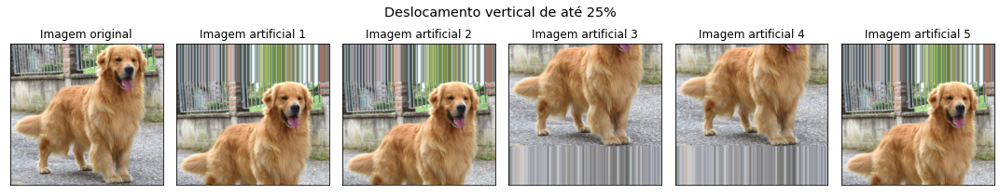

In [216]:
yshift=int(0.25*dim[1])

# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(height_shift_range=[-yshift,yshift])

displayAugumentedDataset(datagen,img,figsize=(15,3),title='Deslocamento vertical de até 25%')

### Espelhamento

Pode-se espelhar aleatoriamente de forma horizontal ou vertical. Será mostrado o espelhamento horizontal e vertical abaixo:

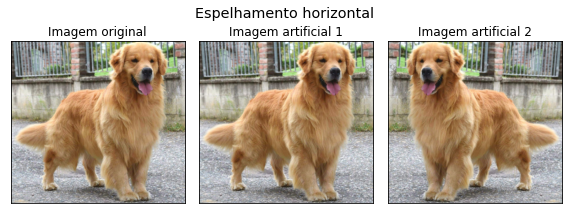

In [218]:
# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(horizontal_flip=True)

displayAugumentedDataset(datagen,img,dim=(1,3),figsize=(8,3),title='Espelhamento horizontal')

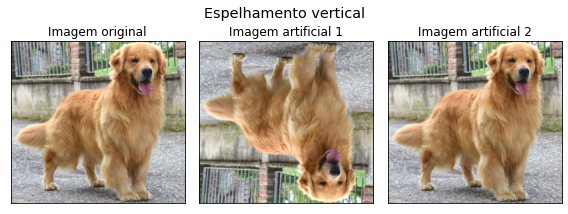

In [220]:
# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(vertical_flip=True)

displayAugumentedDataset(datagen,img,dim=(1,3),figsize=(8,3),title='Espelhamento vertical')

### Rotação

Similar ao espelhamento, mas com ângulo customizável. Segue um exemplo com rotação de até 90 graus:

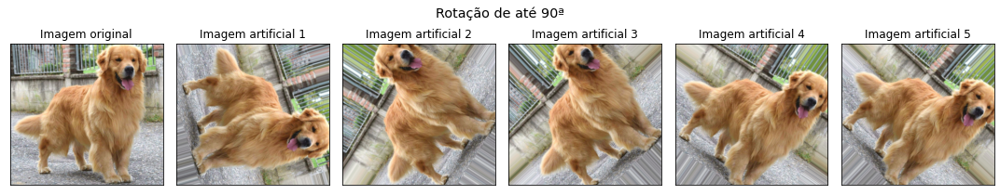

In [221]:
# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(rotation_range=90)

displayAugumentedDataset(datagen,img,figsize=(15,3),title='Rotação de até 90ª')

### Zoom (Ampliação)

Amplia uma parte aleatória da imagem.

Observações:

- Valor menor que 1 aumenta a imagem
- Valor maior que 1 diminui a imagem

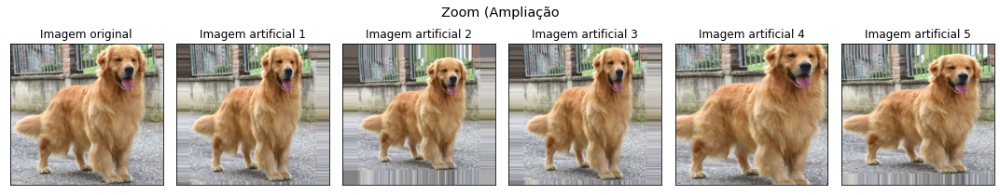

In [707]:
# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(zoom_range=(0.75,1.25))

displayAugumentedDataset(datagen,img,figsize=(15,3),title='Zoom (Ampliação')

### Variação de brilho

- Valores menores que 1 são mais escuros
- Valores maiores que 1 são mais claros

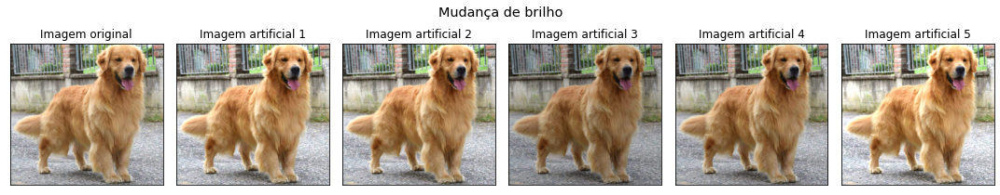

In [223]:
# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(brightness_range=(0.75,1.25))

displayAugumentedDataset(datagen,img,figsize=(15,3),title='Mudança de brilho')

### Misturando tudo

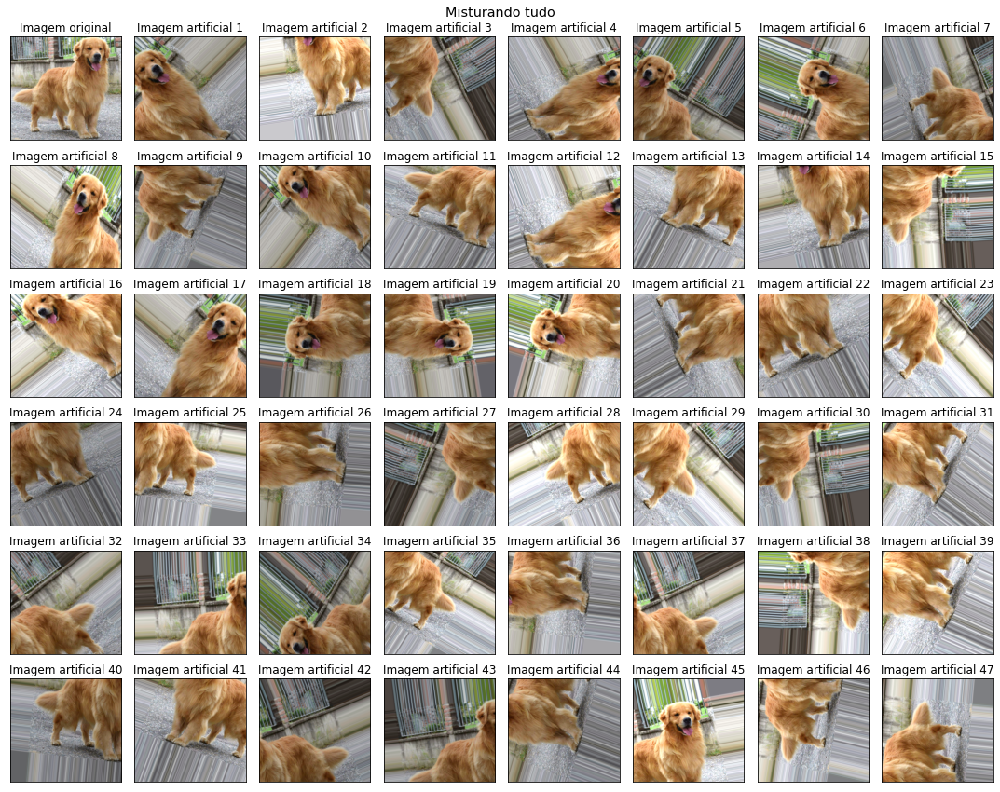

In [708]:
# Criando o objeto com as configurações de aumento de dados
datagen = preprocessing.ImageDataGenerator(
    width_shift_range=[-xshift,xshift], #Deslocamento horizontal
    height_shift_range=[-yshift,yshift], #Deslocamento vertical
    horizontal_flip=True, #espelhamento horizontal
    rotation_range=90, #Rotação
    zoom_range=(0.75,1.0), #Zoom
    brightness_range=(0.75,1.25) #Brilho
)

displayAugumentedDataset(datagen,img,dim=(6,8),figsize=(15,12),title='Misturando tudo')

Existem outros parâmetros, mas esses são os principais.

# Dropout

A técnica de Dropout consiste em:

- Ignorar neurônios durante o treinamento
- Os neurônios são selecionados aleatoriamente com a probabilidade, $p$ fornecida pelo usuário
- Utiliza-se a distribuição de Bernoulli para selecionar os neurônios a serem excluidos
- Esta estratégia permitem que mais neurônios aprendam os padrões das classes
- Diminuindo o overfiting e melhorando a capacidade de generalização

Algumas considerações:

- No artigo original recomenda-se $p=0.5$
- Alguns estudos rescentes indicam $p=0.2$
- Pode-se usar o dropout após a última camada de convolução + pooling
- Não é recomendado utilizar dropout com $p<0.5$
- Na camada de entrada deve-se utilizar $p\leq 0.2$

https://towardsdatascience.com/an-intuitive-explanation-to-dropout-749c7fb5395c

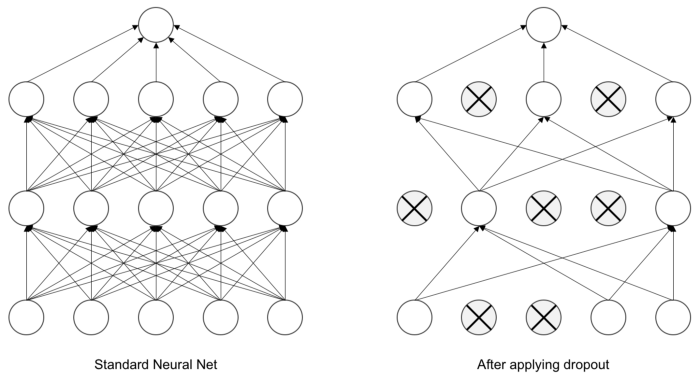


https://medium.com/analytics-vidhya/a-simple-introduction-to-dropout-regularization-with-code-5279489dda1e
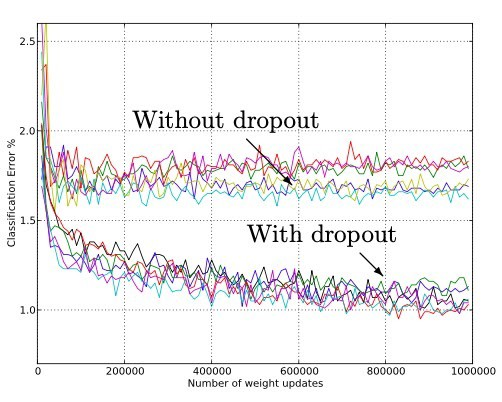

Mais informações:

https://towardsdatascience.com/introduction-to-dropout-to-regularize-deep-neural-network-8e9d6b1d4386

https://towardsdatascience.com/12-main-dropout-methods-mathematical-and-visual-explanation-58cdc2112293

https://towardsdatascience.com/introduction-to-dropout-to-regularize-deep-neural-network-8e9d6b1d4386

https://towardsdatascience.com/simplified-math-behind-dropout-in-deep-learning-6d50f3f47275

# Melhorando a rede neural anterior

## Pré-processamento

Carregando o dataset:

In [454]:
class_names = ['Avião',
               'Carro',
               'Pássaro',
               'Gato',
               'Cervo',
               'Cachorro',
               'Sapo',
               'Cavalo',
               'Barco',
               'Caminhão'
              ]
(x_train,y_train),(x_test,y_test) = tf.keras.datasets.cifar10.load_data()

Criando o gerador de imagem através do `ImageDataGenerator`:

In [718]:
datagen_train = preprocessing.ImageDataGenerator(
    rescale=1/255.0, #Normalização das imagens
    width_shift_range=0.1, #Deslocamento horizontal de \pm10%
    height_shift_range=0.1, #Deslocamento vertical de \pm10%
    rotation_range=20, #rotação de \pm20 graus
    zoom_range=0.2, #zoom de \pm20%
    brightness_range=(0.75,1.25), #brilho de \pm25%
    horizontal_flip=True #Espelhamento vertical
)

# Usando o ImageDataGenerator para normalização
datagen_test = preprocessing.ImageDataGenerator(
    rescale=1/255.0 #Os dados de teste não serão alterados (apenas normalizados)
)

Criando os iteráveis de teste e treino:

In [719]:
# Criando o iterável de treino
train_generator = datagen_train.flow(
    x=x_train, #Imagem
    y=y_train, #Resposta
    batch_size=32, #Tamanho do lote (batch)
    shuffle=True #Embaralha os dados
)
# Criando o iterável de validação
validation_generator = datagen_test.flow(
    x=x_test, #Imagem
    y=y_test, #Resposta
    batch_size=32, #Tamanho do lote (batch)
    shuffle=True #Embaralha os dados
)

Mostrando uma amostra dos datasets de teste e treino:

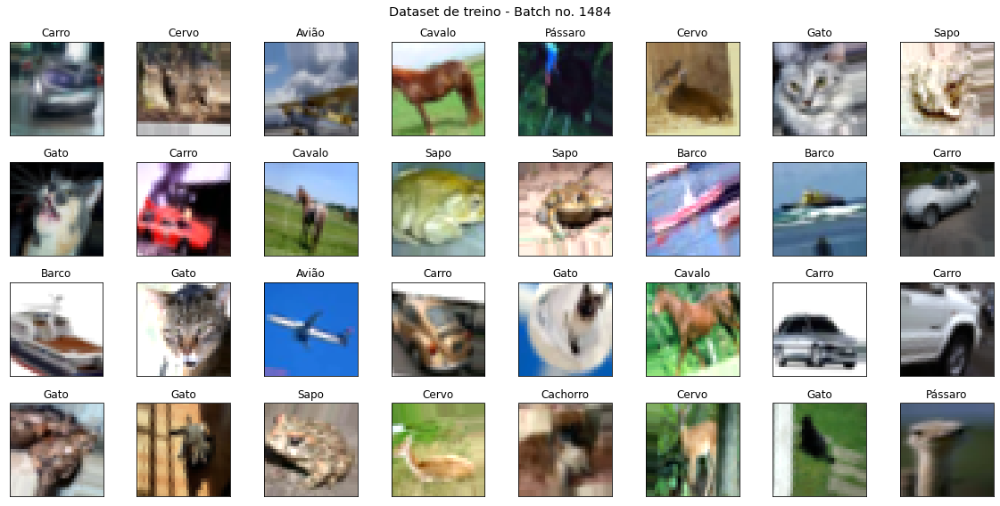

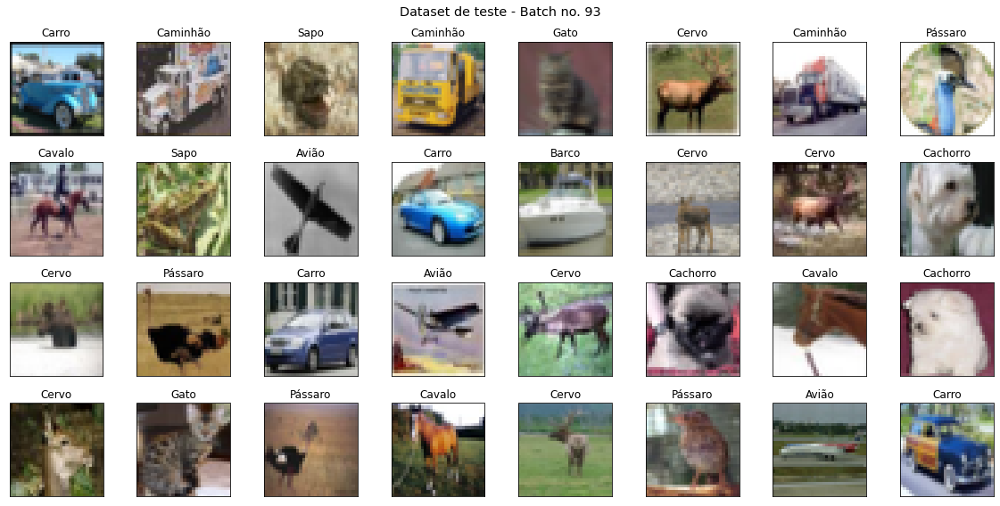

In [467]:
displayBatch(train_generator,classes=class_names,dim=(4,8),title='Dataset de treino')
displayBatch(validation_generator,classes=class_names,dim=(4,8),title='Dataset de teste')

## Rede Neural

Construíndo a rede neural:

In [468]:
model2 = tf.keras.models.Sequential([
    # 1a camada de convolução
    tf.keras.layers.Conv2D(filters=32, input_shape=(32,32,3), kernel_size=3, padding='same', activation='relu', name='Conv1'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool1'),
    # 2a camada de convolução
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu', name='Conv2'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool2'),
    # 3a camada de convolução
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu', name='Conv3'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool3'),
    # 4a camada de convolução
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu', name='Conv4'),
#     tf.keras.layers.MaxPool2D(pool_size=2, name='Pool4'),
    tf.keras.layers.Dropout(
        rate=0.2, #20% dos neurônios serão desativados
        name='DropConv'
    ),
    ## Rede neural densa
    tf.keras.layers.Flatten(name='Flatten'),
    tf.keras.layers.Dense(units=512, activation='relu', name='Dense1'),
    tf.keras.layers.Dropout(
        rate=0.2, #20% dos neurônios serão desativados
        name='Drop1'
    ),
    tf.keras.layers.Dense(units=128, activation='relu', name='Dense2'),
    tf.keras.layers.Dropout(
        rate=0.2, #20% dos neurônios serão desativados
        name='Drop2'
    ),
    tf.keras.layers.Dense(units=10, activation='softmax', name='Out')
])

Visualizando a rede neural:

In [469]:
model2.summary()

Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv1 (Conv2D)               (None, 32, 32, 32)        896       
_________________________________________________________________
Pool1 (MaxPooling2D)         (None, 16, 16, 32)        0         
_________________________________________________________________
Conv2 (Conv2D)               (None, 16, 16, 64)        18496     
_________________________________________________________________
Pool2 (MaxPooling2D)         (None, 8, 8, 64)          0         
_________________________________________________________________
Conv3 (Conv2D)               (None, 8, 8, 128)         73856     
_________________________________________________________________
Pool3 (MaxPooling2D)         (None, 4, 4, 128)         0         
_________________________________________________________________
Conv4 (Conv2D)               (None, 4, 4, 128)       

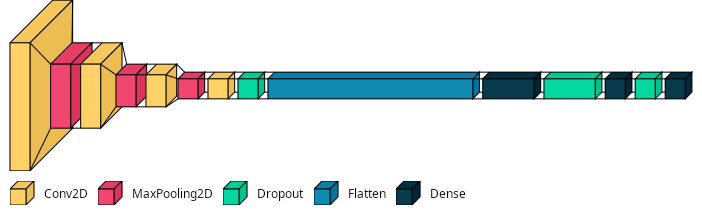

In [470]:
import visualkeras
from PIL import ImageFont #Carrega o módulo de fonte para imagem

font = ImageFont.truetype("NotoSans-Regular.ttf", 12)  # using comic sans is strictly prohibited!

visualkeras.layered_view(model2,to_file='model_cnn_improved.png',legend=True, font=font)

## Treinando a rede neural

Será similar ao notebook anterior.

Configurando o treino da rede neural (Compilando):

In [471]:
#opt = tf.keras.optimizers.Adam(learning_rate=2e-3) # https://keras.io/api/optimizers/ learning_rate=0.01
model2.compile(loss="sparse_categorical_crossentropy",optimizer="Adam",metrics=["sparse_categorical_accuracy"])

Configurando os `callbacks` de taxa de aprendizado adaptativa:

In [472]:
epochs=50
# Callbacks

rlrop = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=int(epochs/10))

# Define um descrescimento exponencial
lrs = tf.keras.callbacks.LearningRateScheduler(lambda epoch, lrate: lrate*1e2**(-(epoch-1)/epochs))

Durante o treino será utilizado como parâmetros os generators criado anteriormente:
- Iterável de treino (Primeiro parâmetro) $\rightarrow$ Não é necessário colocar `x` e `y`
- `validation_data` $\rightarrow$ Generator de validação
- **Não é necessário adicionar** o `batch` pois essa informação está explicita no iterável

In [473]:
history = model2.fit(train_generator, #Gerador de treino
                    validation_data=validation_generator, #Gerador de images
                    epochs=epochs, #Passos
                    #callbacks=[rlrop,lrs]
                   );

Epoch 1/50
1563/1563 [==============================] - 33s 21ms/step - loss: 1.6736 - sparse_categorical_accuracy: 0.3838 - val_loss: 1.3655 - val_sparse_categorical_accuracy: 0.5077
Epoch 2/50
1563/1563 [==============================] - 32s 21ms/step - loss: 1.3402 - sparse_categorical_accuracy: 0.5218 - val_loss: 1.2340 - val_sparse_categorical_accuracy: 0.5575
Epoch 3/50
1563/1563 [==============================] - 32s 21ms/step - loss: 1.2119 - sparse_categorical_accuracy: 0.5725 - val_loss: 1.0685 - val_sparse_categorical_accuracy: 0.6197
Epoch 4/50
1563/1563 [==============================] - 33s 21ms/step - loss: 1.1265 - sparse_categorical_accuracy: 0.6046 - val_loss: 0.9713 - val_sparse_categorical_accuracy: 0.6664
Epoch 5/50
1563/1563 [==============================] - 33s 21ms/step - loss: 1.0715 - sparse_categorical_accuracy: 0.6260 - val_loss: 0.9363 - val_sparse_categorical_accuracy: 0.6760
Epoch 6/50
1563/1563 [==============================] - 33s 21ms/step - loss: 1.

## Validando a rede neural

Fitness e acurácia:

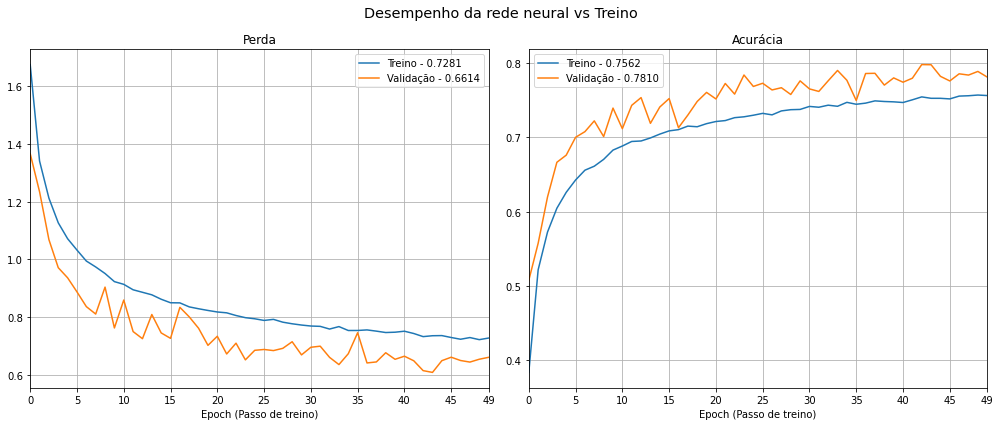

In [475]:
fig, ax = plt.subplots(1,2,figsize=(14,6))

keys = {"loss":"Treino","val_loss":"Predito"}

for i, ax in enumerate(ax):
    for j, key in zip(np.arange(0,3,2)+i,history.history.keys()):
        data = np.array(list(history.history.values())[j])
        key = list(history.history.keys())[j]
        ax.plot(data,label=("Validação" if "val" in key else "Treino")+f' - {data[-1]:.4f}')
        ax.legend()
        ax.grid(True)
        ax.set_xticks(np.r_[np.arange(0,data.size,np.round(data.size/10)),data.size-1])
        ax.set_xlim(0,data.size-1)
        ax.set_xlabel('Epoch (Passo de treino)')
        #ax.set_ylabel('Por unidade (Probabilidade)')
        ax.set_title(('Acurácia' if "accuracy" in key else "Perda"))
fig.suptitle('Desempenho da rede neural vs Treino',fontsize='x-large');
plt.tight_layout();

In [546]:
validation_metrics = datagen_test.flow(
    x=x_test, #Imagem
    y=y_test, #Resposta
    batch_size=1, #Tamanho do lote (batch)
    shuffle=False #Embaralha os dados
)
prediction2=model2.predict(validation_metrics).argmax(axis=1)
prediction2

array([3, 8, 8, ..., 5, 1, 7])

Métricas do Sklearn:

In [547]:
import sklearn

In [548]:
from sklearn.metrics import confusion_matrix

Matriz de confusão:

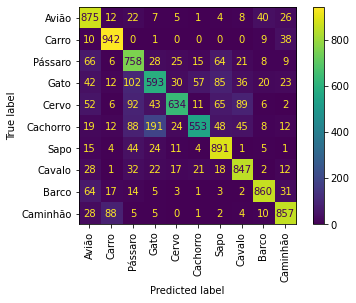

In [549]:
confusion_matrix=sklearn.metrics.confusion_matrix(y_test, #Valores reais
                                                  prediction2, #Valores preditos
                                                  normalize=None
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Matriz de confusão normalizada:

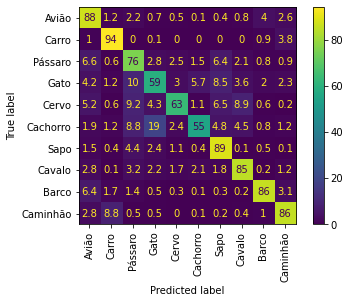

In [550]:
confusion_matrix=sklearn.metrics.confusion_matrix(y_test, #Valores reais
                                                  prediction2, #Valores preditos
                                                  normalize='true'
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix*100, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Classification Report

In [551]:
print(sklearn.metrics.classification_report(Y_test, #Valores reais
                                            prediction2, # Valores preditos
                                            target_names=class_names # Nome das Labels
                                           ))

              precision    recall  f1-score   support

       Avião       0.73      0.88      0.80      1000
       Carro       0.86      0.94      0.90      1000
     Pássaro       0.66      0.76      0.70      1000
        Gato       0.65      0.59      0.62      1000
       Cervo       0.85      0.63      0.72      1000
    Cachorro       0.83      0.55      0.66      1000
        Sapo       0.76      0.89      0.82      1000
      Cavalo       0.80      0.85      0.83      1000
       Barco       0.89      0.86      0.87      1000
    Caminhão       0.85      0.86      0.85      1000

    accuracy                           0.78     10000
   macro avg       0.79      0.78      0.78     10000
weighted avg       0.79      0.78      0.78     10000



Desempenho de um lote:

In [594]:
def displayBatchPredito(datagen,model,labels,dim=(4,6),figsize=None,verb=False):
    if figsize==None:
        figsize=(2*dim[1],2*dim[0])
    fig, ax = plt.subplots(dim[0],dim[1],figsize=figsize,sharex=True,sharey=True)
    
    randi = int(np.random.randint(len(datagen)))
    
    y_hat=model(datagen[randi][0]).numpy().argmax(axis=1)
    
    perda=0
    acuracia=0
    for ax, x, y, y_p in zip(ax.flat,datagen[randi][0],datagen[randi][1], y_hat):
        y=int(y)
        ax.imshow(x)
        ax.set_xticks([])
        ax.set_yticks([])
        t = f'{labels[y_p]}-{y_p}-{y}' if verb else f'{labels[y_p]}{f" | {labels[y]}" if y_p!=y else""}'
        ax.set_title(t)
        perda += int(y != y_p)
        acuracia += int(y == y_p)
    tam=perda+acuracia
    plt.suptitle(f'Batch no. {randi} | Perda: {perda/tam:.3f} ({perda}/{tam}) | Acurácia: {acuracia/tam:.3f} ({acuracia}/{tam})',fontsize='x-large')
    plt.tight_layout()

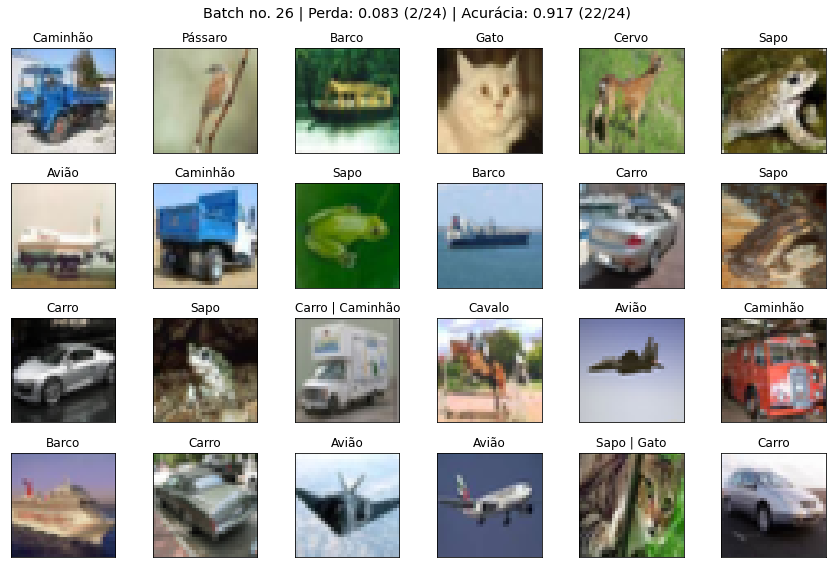

In [595]:
displayBatchPredito(validation_generator,model2,class_names)

# Global Average Pooling (GAP)

- GAP ou Global Average Pooling é uma alternativa a camada Flatten
- Calcula-se o valor médio de cada mapa de característica e concatena em um único vetor
- Em alguns casos, o GAP pode ser subsituido pelas camadas densas

Vantagens em relação à rede neural densa:
- É mais nativo a estrutura de convolução
- Os mapas de características tem maior correspondência com as categorias
- Menos parâmetros para treino
- Em alguns artigos apresentam perfomance superior à rede neural densa

https://paperswithcode.com/method/global-average-pooling#

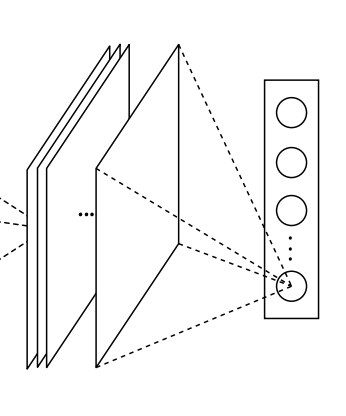

https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/blocks/global-average-pooling-2d

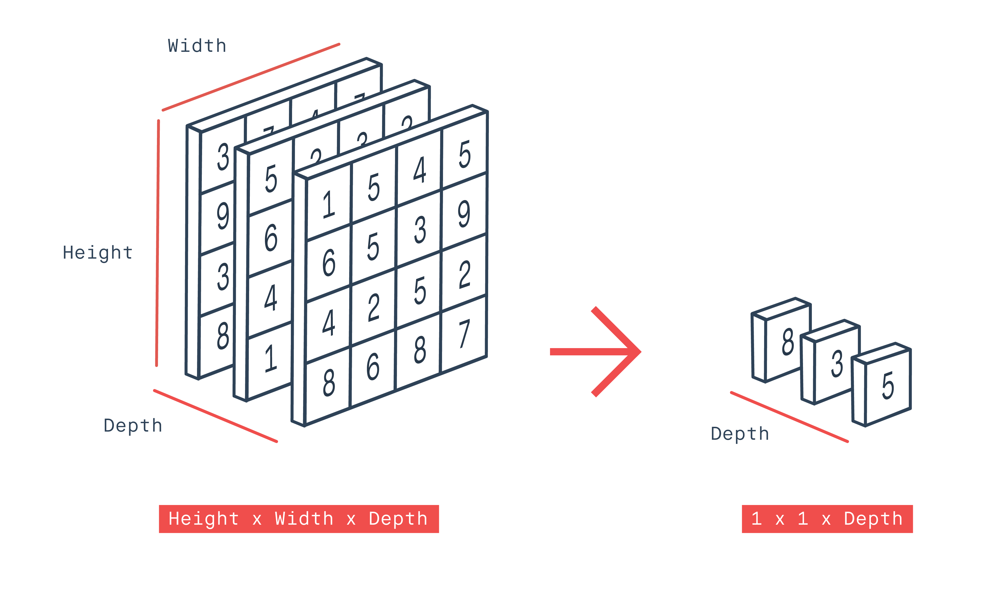

https://adventuresinmachinelearning.com/global-average-pooling-convolutional-neural-networks/

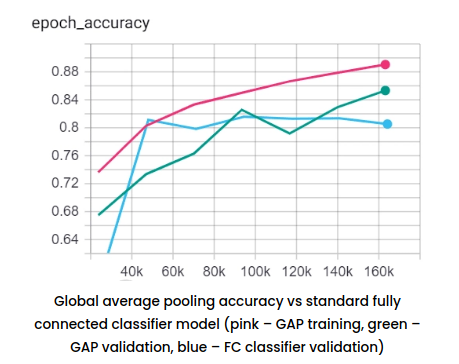

# Rede neural com GAP

## Rede Neural

Construindo a rede neural:

In [636]:
model3 = tf.keras.models.Sequential([
    # 1a camada de convolução
    tf.keras.layers.Conv2D(filters=32, input_shape=(32,32,3), kernel_size=3, padding='same', activation='relu', name='Conv1'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool1'),
    # 2a camada de convolução
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu', name='Conv2'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool2'),
    # 3a camada de convolução
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu', name='Conv3'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool3'),
    # 4a camada de convolução
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu', name='Conv4'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool4'),
    tf.keras.layers.Dropout(
        rate=0.2, #20% dos neurônios serão desativados
        name='DropConv'
    ),
    ## GAP
    tf.keras.layers.GlobalAveragePooling2D(name='GAP'),
    # Camada densa
    tf.keras.layers.Dense(units=10, activation='softmax', name='Out')
])

Visualizando a rede neural:

In [637]:
model3.summary()

Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv1 (Conv2D)               (None, 32, 32, 32)        896       
_________________________________________________________________
Pool1 (MaxPooling2D)         (None, 16, 16, 32)        0         
_________________________________________________________________
Conv2 (Conv2D)               (None, 16, 16, 64)        18496     
_________________________________________________________________
Pool2 (MaxPooling2D)         (None, 8, 8, 64)          0         
_________________________________________________________________
Conv3 (Conv2D)               (None, 8, 8, 128)         73856     
_________________________________________________________________
Pool3 (MaxPooling2D)         (None, 4, 4, 128)         0         
_________________________________________________________________
Conv4 (Conv2D)               (None, 4, 4, 128)       

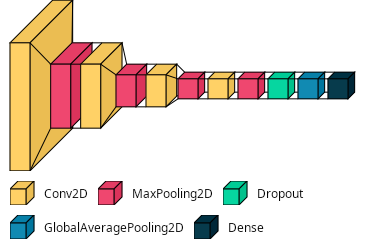

In [638]:
visualkeras.layered_view(model3,to_file='model_cnn_gap.png',legend=True, font=font)

## Treinando a rede neural

In [639]:
model3.compile(loss="sparse_categorical_crossentropy",optimizer="Adam",metrics=["sparse_categorical_accuracy"])

Configurando os `callbacks` de taxa de aprendizado adaptativa:

In [640]:
epochs=50

Durante o treino será utilizado como parâmetros os generators criado anteriormente:
- Iterável de treino (Primeiro parâmetro) $\rightarrow$ Não é necessário colocar `x` e `y`
- `validation_data` $\rightarrow$ Generator de validação
- **Não é necessário adicionar** o `batch` pois essa informação está explicita no iterável

In [641]:
history = model3.fit(train_generator, #Gerador de treino
                    validation_data=validation_generator, #Gerador de images
                    epochs=epochs #Passos
                   );

Epoch 1/50
1563/1563 [==============================] - 30s 19ms/step - loss: 1.6759 - sparse_categorical_accuracy: 0.3827 - val_loss: 1.3798 - val_sparse_categorical_accuracy: 0.5004
Epoch 2/50
1563/1563 [==============================] - 30s 19ms/step - loss: 1.3099 - sparse_categorical_accuracy: 0.5330 - val_loss: 1.1753 - val_sparse_categorical_accuracy: 0.5873
Epoch 3/50
1563/1563 [==============================] - 30s 19ms/step - loss: 1.1574 - sparse_categorical_accuracy: 0.5917 - val_loss: 0.9576 - val_sparse_categorical_accuracy: 0.6741
Epoch 4/50
1563/1563 [==============================] - 30s 19ms/step - loss: 1.0540 - sparse_categorical_accuracy: 0.6297 - val_loss: 0.8605 - val_sparse_categorical_accuracy: 0.6976
Epoch 5/50
1563/1563 [==============================] - 31s 20ms/step - loss: 0.9778 - sparse_categorical_accuracy: 0.6576 - val_loss: 0.8766 - val_sparse_categorical_accuracy: 0.7016
Epoch 6/50
1563/1563 [==============================] - 30s 19ms/step - loss: 0.

## Desempenho da rede neural

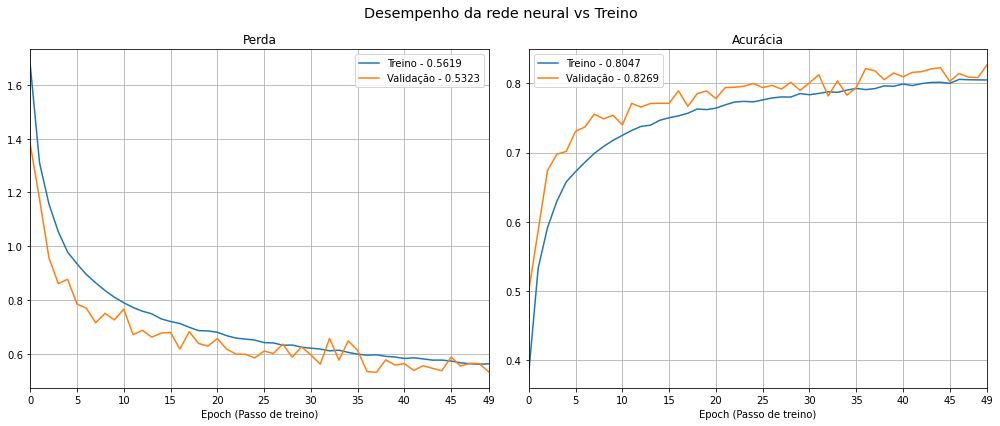

In [642]:
fig, ax = plt.subplots(1,2,figsize=(14,6))

keys = {"loss":"Treino","val_loss":"Predito"}

for i, ax in enumerate(ax):
    for j, key in zip(np.arange(0,3,2)+i,history.history.keys()):
        data = np.array(list(history.history.values())[j])
        key = list(history.history.keys())[j]
        ax.plot(data,label=("Validação" if "val" in key else "Treino")+f' - {data[-1]:.4f}')
        ax.legend()
        ax.grid(True)
        ax.set_xticks(np.r_[np.arange(0,data.size,np.round(data.size/10)),data.size-1])
        ax.set_xlim(0,data.size-1)
        ax.set_xlabel('Epoch (Passo de treino)')
        #ax.set_ylabel('Por unidade (Probabilidade)')
        ax.set_title(('Acurácia' if "accuracy" in key else "Perda"))
fig.suptitle('Desempenho da rede neural vs Treino',fontsize='x-large');
plt.tight_layout();

In [648]:
prediction3=model3.predict(validation_metrics).argmax(axis=1)
prediction3

array([3, 8, 8, ..., 5, 1, 7])

Matriz de confusão:

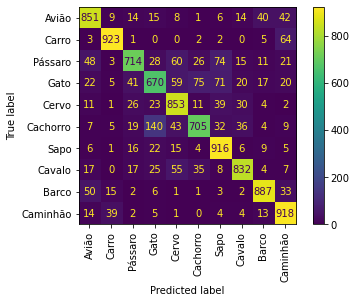

In [649]:
confusion_matrix=sklearn.metrics.confusion_matrix(y_test, #Valores reais
                                                  prediction3, #Valores preditos
                                                  normalize=None
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Matriz de confusão normalizada:

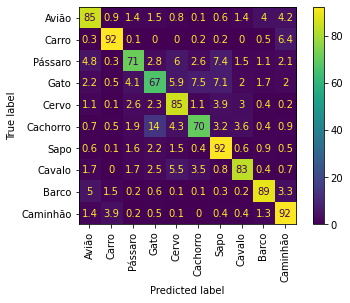

In [650]:
confusion_matrix=sklearn.metrics.confusion_matrix(y_test, #Valores reais
                                                  prediction3, #Valores preditos
                                                  normalize='true'
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix*100, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Classification Report

In [651]:
print(sklearn.metrics.classification_report(Y_test, #Valores reais
                                            prediction3, # Valores preditos
                                            target_names=class_names # Nome das Labels
                                           ))

              precision    recall  f1-score   support

       Avião       0.83      0.85      0.84      1000
       Carro       0.92      0.92      0.92      1000
     Pássaro       0.84      0.71      0.77      1000
        Gato       0.72      0.67      0.69      1000
       Cervo       0.78      0.85      0.81      1000
    Cachorro       0.82      0.70      0.76      1000
        Sapo       0.79      0.92      0.85      1000
      Cavalo       0.87      0.83      0.85      1000
       Barco       0.89      0.89      0.89      1000
    Caminhão       0.82      0.92      0.87      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



Desempenho de um lote:

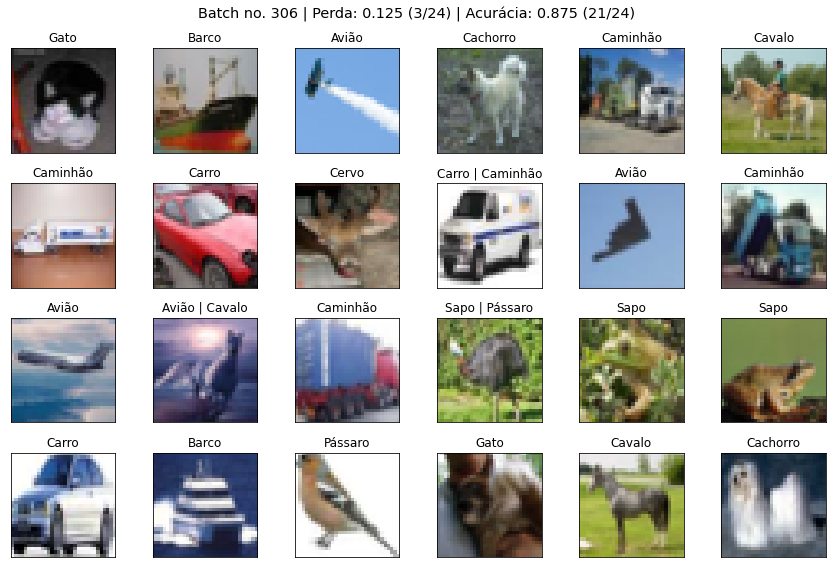

In [653]:
displayBatchPredito(validation_generator,model3,class_names)

# Melhorando a rede neural anterior

- Adicionando mais filtros na última camada de convolução
- Aumentando o `dropout rate` para `0.5`
- Modificando os parâmentros de pré-processamento para aumentar a variabilidade dos dados
- Aumentando a quantidade de `epochs` para 75

## Modificando os parâmetros de pré-processamento

Criando o gerador de imagem através do `ImageDataGenerator`:

In [715]:
datagen_train2 = preprocessing.ImageDataGenerator(
    rescale=1/255.0, #Normalização das imagens
    width_shift_range=0.1, #Deslocamento horizontal de \pm10%
    height_shift_range=0.1, #Deslocamento vertical de \pm10%
    rotation_range=30, #rotação de \pm30 graus
    zoom_range=0.3, #zoom de \pm30%
    brightness_range=(0.75,1.25), #brilho de \pm25%
    horizontal_flip=True #Espelhamento vertical
)

# Usando o ImageDataGenerator para normalização
datagen_test2 = preprocessing.ImageDataGenerator(
    rescale=1/255.0 #Os dados de teste não serão alterados (apenas normalizados)
)

Criando os iteráveis de teste e treino:

In [716]:
# Criando o iterável de treino
train_generator2 = datagen_train.flow(
    x=x_train, #Imagem
    y=y_train, #Resposta
    batch_size=32, #Tamanho do lote (batch)
    shuffle=True #Embaralha os dados
)
# Criando o iterável de validação
validation_generator2 = datagen_test.flow(
    x=x_test, #Imagem
    y=y_test, #Resposta
    batch_size=32, #Tamanho do lote (batch)
    shuffle=True #Embaralha os dados
)

Mostrando uma amostra dos datasets de teste e treino:

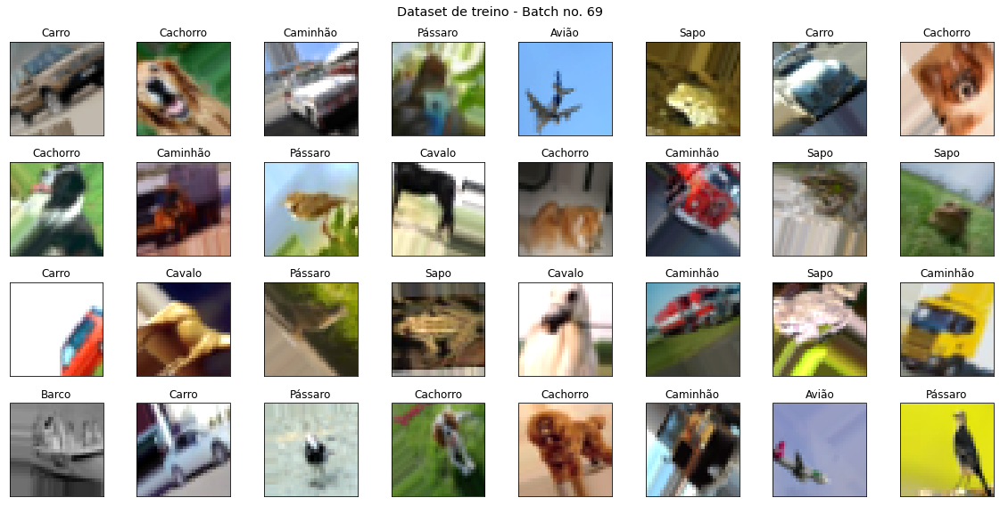

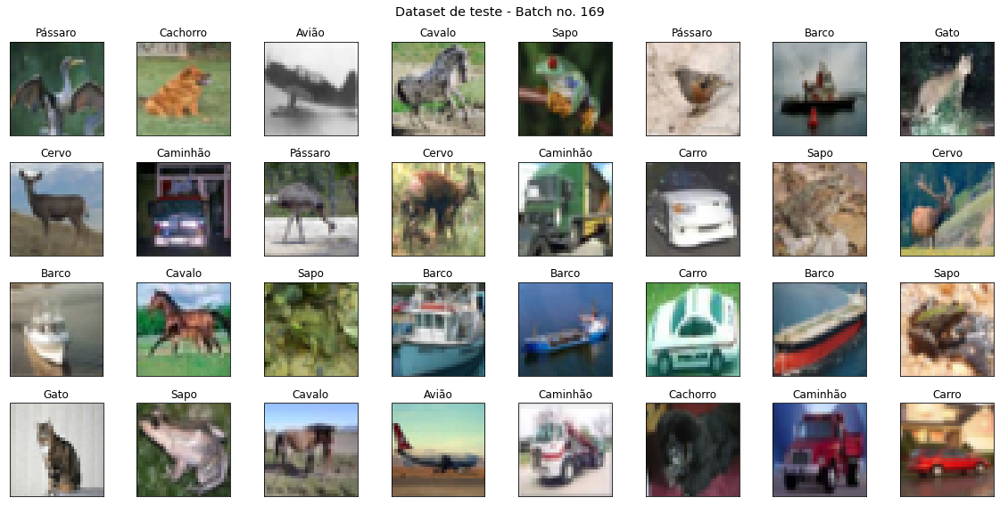

In [717]:
displayBatch(train_generator2,classes=class_names,dim=(4,8),title='Dataset de treino')
displayBatch(validation_generator2,classes=class_names,dim=(4,8),title='Dataset de teste')

## Rede Neural

Construindo a rede neural:

In [686]:
model4 = tf.keras.models.Sequential([
    # 1a camada de convolução
    tf.keras.layers.Conv2D(filters=32, input_shape=(32,32,3), kernel_size=3, padding='same', activation='relu', name='Conv1'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool1'),
    # 2a camada de convolução
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu', name='Conv2'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool2'),
    # 3a camada de convolução
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu', name='Conv3'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool3'),
    # 4a camada de convolução
    tf.keras.layers.Conv2D(filters=256, kernel_size=3, padding='same', activation='relu', name='Conv4'),
    tf.keras.layers.MaxPool2D(pool_size=2, name='Pool4'),
    ## GAP
    tf.keras.layers.GlobalAveragePooling2D(name='GAP'),
    tf.keras.layers.Dropout(
        rate=0.5, #50% dos neurônios serão desativados
        name='DropConv'
    ),
    # Camada densa
    tf.keras.layers.Dense(units=10, activation='softmax', name='Out')
])

Visualizando a rede neural:

In [687]:
model4.summary()

Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv1 (Conv2D)               (None, 32, 32, 32)        896       
_________________________________________________________________
Pool1 (MaxPooling2D)         (None, 16, 16, 32)        0         
_________________________________________________________________
Conv2 (Conv2D)               (None, 16, 16, 64)        18496     
_________________________________________________________________
Pool2 (MaxPooling2D)         (None, 8, 8, 64)          0         
_________________________________________________________________
Conv3 (Conv2D)               (None, 8, 8, 128)         73856     
_________________________________________________________________
Pool3 (MaxPooling2D)         (None, 4, 4, 128)         0         
_________________________________________________________________
Conv4 (Conv2D)               (None, 4, 4, 256)       

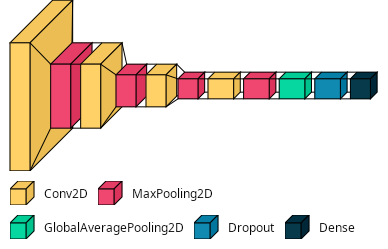

In [688]:
visualkeras.layered_view(model4,to_file='model_cnn_gap.png',legend=True, font=font)

## Treinando a rede neural

In [689]:
model4.compile(loss="sparse_categorical_crossentropy",optimizer="Adam",metrics=["sparse_categorical_accuracy"])

Configurando os `callbacks` de taxa de aprendizado adaptativa:

In [690]:
epochs=75

Durante o treino será utilizado como parâmetros os generators criado anteriormente:
- Iterável de treino (Primeiro parâmetro) $\rightarrow$ Não é necessário colocar `x` e `y`
- `validation_data` $\rightarrow$ Generator de validação
- **Não é necessário adicionar** o `batch` pois essa informação está explicita no iterável

In [691]:
history = model4.fit(train_generator, #Gerador de treino
                    validation_data=validation_generator, #Gerador de images
                    epochs=epochs #Passos
                   );

Epoch 1/75
1563/1563 [==============================] - 32s 20ms/step - loss: 1.8974 - sparse_categorical_accuracy: 0.2997 - val_loss: 1.6376 - val_sparse_categorical_accuracy: 0.4253
Epoch 2/75
1563/1563 [==============================] - 32s 21ms/step - loss: 1.6347 - sparse_categorical_accuracy: 0.4113 - val_loss: 1.4271 - val_sparse_categorical_accuracy: 0.4846
Epoch 3/75
1563/1563 [==============================] - 32s 21ms/step - loss: 1.5115 - sparse_categorical_accuracy: 0.4558 - val_loss: 1.2808 - val_sparse_categorical_accuracy: 0.5317
Epoch 4/75
1563/1563 [==============================] - 32s 21ms/step - loss: 1.4459 - sparse_categorical_accuracy: 0.4796 - val_loss: 1.2124 - val_sparse_categorical_accuracy: 0.5674
Epoch 5/75
1563/1563 [==============================] - 32s 21ms/step - loss: 1.3828 - sparse_categorical_accuracy: 0.5056 - val_loss: 1.1800 - val_sparse_categorical_accuracy: 0.5760
Epoch 6/75
1563/1563 [==============================] - 32s 21ms/step - loss: 1.

## Desempenho da rede neural

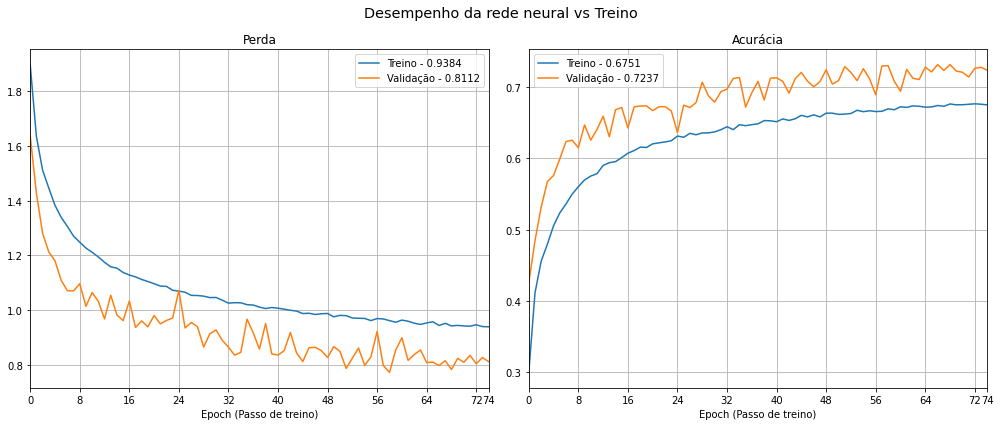

In [709]:
fig, ax = plt.subplots(1,2,figsize=(14,6))

keys = {"loss":"Treino","val_loss":"Predito"}

for i, ax in enumerate(ax):
    for j, key in zip(np.arange(0,3,2)+i,history.history.keys()):
        data = np.array(list(history.history.values())[j])
        key = list(history.history.keys())[j]
        ax.plot(data,label=("Validação" if "val" in key else "Treino")+f' - {data[-1]:.4f}')
        ax.legend()
        ax.grid(True)
        ax.set_xticks(np.r_[np.arange(0,data.size,np.round(data.size/10)),data.size-1])
        ax.set_xlim(0,data.size-1)
        ax.set_xlabel('Epoch (Passo de treino)')
        #ax.set_ylabel('Por unidade (Probabilidade)')
        ax.set_title(('Acurácia' if "accuracy" in key else "Perda"))
fig.suptitle('Desempenho da rede neural vs Treino',fontsize='x-large');
plt.tight_layout();

In [710]:
prediction4=model4.predict(validation_metrics).argmax(axis=1)
prediction4

array([3, 1, 8, ..., 5, 1, 7])

Matriz de confusão:

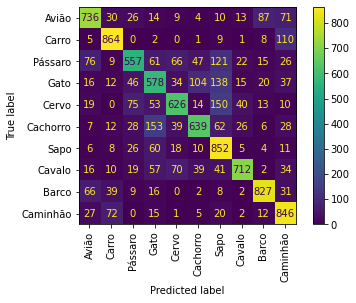

In [711]:
confusion_matrix=sklearn.metrics.confusion_matrix(y_test, #Valores reais
                                                  prediction4, #Valores preditos
                                                  normalize=None
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Matriz de confusão normalizada:

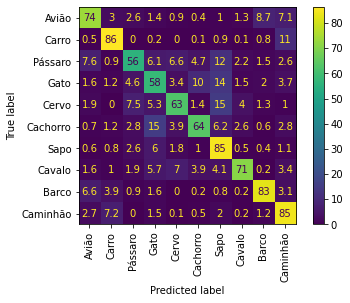

In [712]:
confusion_matrix=sklearn.metrics.confusion_matrix(y_test, #Valores reais
                                                  prediction4, #Valores preditos
                                                  normalize='true'
                                                 )
# Cria o objeto de confusion matrix display
cm=sklearn.metrics.ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix*100, # Matriz de confusão
    display_labels=class_names #Labels
);
# Usa o método plot para mostrar a matriz de confusão
cm.plot(xticks_rotation='vertical');

Classification Report

In [713]:
print(sklearn.metrics.classification_report(Y_test, #Valores reais
                                            prediction4, # Valores preditos
                                            target_names=class_names # Nome das Labels
                                           ))

              precision    recall  f1-score   support

       Avião       0.76      0.74      0.75      1000
       Carro       0.82      0.86      0.84      1000
     Pássaro       0.71      0.56      0.62      1000
        Gato       0.57      0.58      0.58      1000
       Cervo       0.73      0.63      0.67      1000
    Cachorro       0.74      0.64      0.69      1000
        Sapo       0.60      0.85      0.71      1000
      Cavalo       0.85      0.71      0.77      1000
       Barco       0.83      0.83      0.83      1000
    Caminhão       0.70      0.85      0.77      1000

    accuracy                           0.72     10000
   macro avg       0.73      0.72      0.72     10000
weighted avg       0.73      0.72      0.72     10000



Desempenho de um lote:

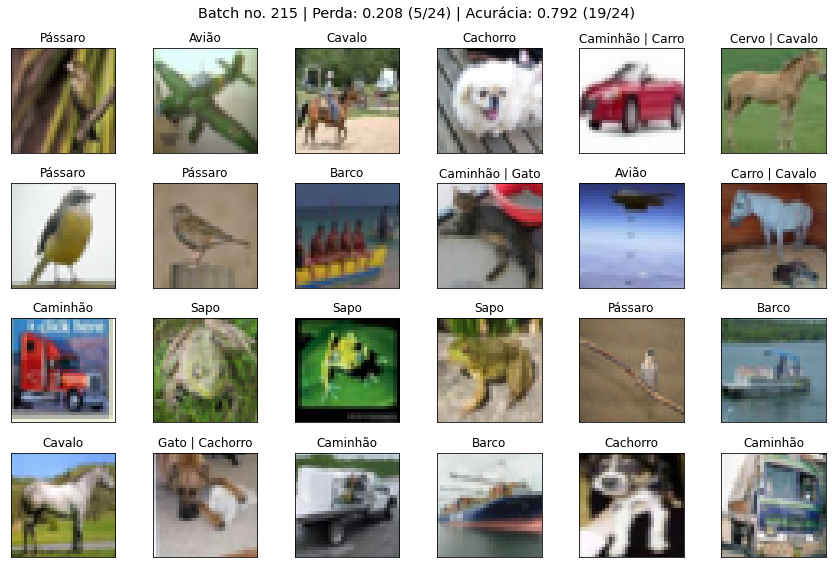

In [721]:
displayBatchPredito(validation_generator,model4,class_names)